# Unsupervised Learning
In this assignment, you will explore unsupervised learning techniques for clustering and dimensionality reduction, and apply them to the MNIST database of handwritten digits. Your task is to explore the use of clustering methods and dimensionality reduction techniques as steps preceding to classification. Note that some of the methods described in this assignment are for pedagogical purposes only and are considered bad practice.
You should submit a brief report according to the attached template describing your work and finding. The report should be accompanied with a single ipython notebook (.ipynb) file that includes all the code and outputs.
You are encouraged to use methods and techniques covered in class but are also welcome to use any other relevant method you find suitable for the task if you justify your decision. Make sure to use proper ML and DS methodologies when needed (Data preprocessing, Data splits, etc...).

# Submitted

*   Timor Baruch
*   Hadar Pur

## Installs

In [ ]:
!pip install -q umap-learn
!pip install -q scikit-learn
!pip install -q seaborn matplotlib

## Imports

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import plotly.express as px
import umap.umap_ as umap

from sklearn.datasets import fetch_openml
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.spatial.distance import cdist
import itertools
from sklearn.metrics import mean_squared_error, accuracy_score

from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score, silhouette_score
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.gridspec import GridSpec
import torch
from sklearn.metrics import davies_bouldin_score

from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsClassifier
from collections import Counter
from sklearn.metrics import confusion_matrix

import warnings
warnings.filterwarnings('ignore')

## Part 0: Load the data
(1) Load the MNIST dataset.

(2) Explore the data briefly

### Load the MNIST dataset.


In [ ]:
if 'mnist' not in locals():
    mnist = fetch_openml(name = 'mnist_784', version=1, parser='auto')

### Explore the data briefly



In [ ]:
print(f'MNIST descreption:\n{mnist.DESCR}')

MNIST descreption:
**Author**: Yann LeCun, Corinna Cortes, Christopher J.C. Burges  
**Source**: [MNIST Website](http://yann.lecun.com/exdb/mnist/) - Date unknown  
**Please cite**:  

The MNIST database of handwritten digits with 784 features, raw data available at: http://yann.lecun.com/exdb/mnist/. It can be split in a training set of the first 60,000 examples, and a test set of 10,000 examples  

It is a subset of a larger set available from NIST. The digits have been size-normalized and centered in a fixed-size image. It is a good database for people who want to try learning techniques and pattern recognition methods on real-world data while spending minimal efforts on preprocessing and formatting. The original black and white (bilevel) images from NIST were size normalized to fit in a 20x20 pixel box while preserving their aspect ratio. The resulting images contain grey levels as a result of the anti-aliasing technique used by the normalization algorithm. the images were centered

In [ ]:
print("Number of samples:", len(mnist.data))
print("Number of features:", mnist.data.shape[1])
print("Number of classes:", len(set(mnist.target)))

Number of samples: 70000
Number of features: 784
Number of classes: 10


In [ ]:
def generate_examples():
  fig, axes = plt.subplots(4, 5, figsize=(10, 7))
  for i, ax in enumerate(axes.flat):
      ax.imshow(np.array(mnist.data.iloc[i]).reshape(28, 28), cmap='gray')
      ax.set_title(f"Digit {mnist.target[i]}")
      ax.axis('off')
  plt.show()

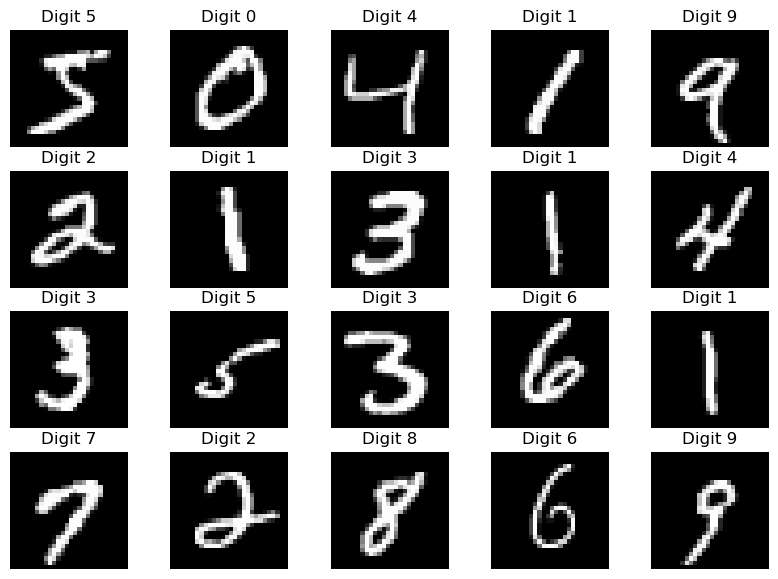

In [ ]:
generate_examples()

#### Distribution of the digits in the dataset

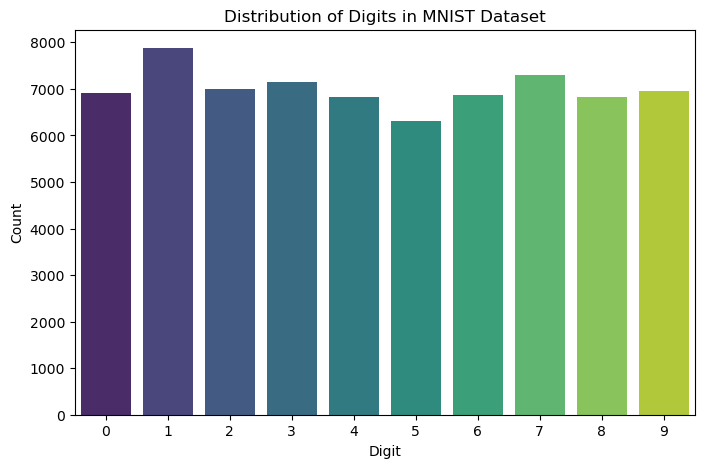

In [ ]:
mnist_df = pd.DataFrame({'Label': mnist.target})

# Plot the distribution of digits
plt.figure(figsize=(8, 5))
sns.countplot(x='Label', data=mnist_df, palette='viridis')
plt.title('Distribution of Digits in MNIST Dataset')
plt.xlabel('Digit')
plt.ylabel('Count')
plt.show()

### Split the data into train and test sets

In [ ]:
# Perform train-test split
x_train, x_test, y_train, y_test = train_test_split(mnist.data, mnist.target, test_size=0.2, random_state=42)

In [ ]:
data = {'x_train': [len(x_train)],
        'x_test': [len(x_test)],
        'y_train': [len(y_train)],
        'y_test': [len(y_test)]}

df = pd.DataFrame(data, index=['Amount'])

print(df.to_markdown())

|        |   x_train |   x_test |   y_train |   y_test |
|:-------|----------:|---------:|----------:|---------:|
| Amount |     56000 |    14000 |     56000 |    14000 |


## Utils

### Visualization methods

#### Function to visualize 2D and 3D clusters

In [ ]:
def visualize_clusters(X, labels, title, dim=2, x_label="Principal Component 1", y_label="Principal Component 2", z_label = "Principal Component 3"):
    if dim == 2:
        fig, ax = plt.subplots(figsize=(8, 6))
        sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, legend='full', palette='Spectral', s=5, ax=ax)
        ax.set(title=title, aspect='equal', xlabel=x_label, ylabel=y_label)
        ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0))
        plt.show()
    elif dim == 3:
        fig = plt.figure(figsize=(8, 6))
        ax = fig.add_subplot(111, projection='3d')
        scatter = ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=labels, cmap='Spectral', edgecolors='k', s=5)
        ax.set(title=title, xlabel=x_label, ylabel=y_label, zlabel=z_label)
        legend = ax.legend(*scatter.legend_elements(), title="Classes", loc='upper right')
        ax.add_artist(legend)
        plt.show()

#### Variance Plotting for PCA

In [ ]:
def plot_explained_variance_for_each_principle_component(pca, n_components):
    plt.figure(1, figsize=(8, 6))
    plt.bar(range(1, n_components + 1), pca.explained_variance_ratio_ * 100, alpha=0.8, align='center', label='Explained Variance Percentage')
    plt.grid()
    plt.xlabel('Number of Components')
    plt.ylabel('Explained Variance (%)')
    plt.title(f'Explained Variance for {n_components} PCA Components')
    plt.legend()
    plt.show()

def plot_cumulative_explained_variance(pca, n_components):
    variance_precentege = pca.explained_variance_ratio_
    cum_variance = np.cumsum(variance_precentege * 100)
    plt.figure(figsize=(8,6))
    plt.plot(range(1, n_components + 1), cum_variance, linewidth=2)
    plt.grid()
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance (%)')
    plt.title(f'Cumulative Explained Variance with {n_components} Components')
    plt.show()
    print(f"Cumulative Variance for first {n_components} principle components is: {cum_variance[-1]:.4f}%")

def scree_plot(pca):
    num_components = len(pca.explained_variance_ratio_)
    ind = np.arange(num_components)
    vals = pca.explained_variance_ratio_

    plt.figure(figsize=(22, 6))
    ax = plt.subplot(111)
    cumvals = np.cumsum(vals)
    ax.bar(ind, vals)
    ax.plot(ind, cumvals)
    for i in range(num_components):
        ax.annotate(r"%s%%" % ((str(round(vals[i]*100,1))[:3])), (ind[i]+0.2, vals[i]),
                    va="bottom",
                    ha="center",
                    fontsize=10)

    ax.xaxis.set_tick_params(width=0)
    ax.yaxis.set_tick_params(width=1, length=3)

    ax.set_xlabel("Number of Components")
    ax.set_ylabel("Variance Explained (%)")
    plt.title('Explained Variance Per Principal Component')

def plot_filtered_results(results_df, n_components, learning_rate):
    # Set Seaborn style
    sns.set(style="whitegrid")

    # Filter the data
    filtered_df = results_df[(results_df['n_components'] == n_components) & (results_df['learning_rate'] == learning_rate)]

    # Set the title
    title = f"n_components = {n_components}, learning_rate = {learning_rate}"

    # Create a beautiful line plot
    plt.figure(figsize=(8, 4))
    sns.lineplot(x=filtered_df['perplexity'], y=filtered_df['min_divergence'], marker="o", color="skyblue", label="Divergence")
    plt.title(title, fontsize=16)
    plt.xlabel("Perplexity Values", fontsize=14)
    plt.ylabel("Divergence", fontsize=14)
    plt.legend(fontsize=12)
    sns.despine()  # Remove top and right spines for aesthetics
    plt.show()

#### Reconstruct digits after Dimentionality Reduction

In [ ]:
def plot_digits(data):
  fig, axes = plt.subplots(4, 10, figsize=(10, 4),
                            subplot_kw={'xticks': [], 'yticks': []},
                            gridspec_kw=dict(hspace=0.1, wspace=0.1))
  for i, ax in enumerate(axes.flat):
      ax.imshow(data[i].reshape(28, 28),
                cmap='binary_r',
                interpolation='nearest',
                clim=(0, 16))

## Part 1: Dimensionality reduction
(3) For two different dimensionality reduction methods of your choice perform:

* Reduce the dimensionality of the raw pixel data.

* Visualize the first two features in the new space and present the digit labels.

* Explore the tunable parameters of the algorithm and their effect on the results.

(4) Select one dimensionality reduction result as the “best” to be used in the following sections.

### For two different dimensionality reduction methods of your choice perform:
*   Reduce the dimensionality of the raw pixel data.
*   Visualize the first two features in the new space and present the digit labels.
*   Explore the tunable parameters of the algorithm and their effect on the results

#### Reduce the dimensionality of the raw pixel data.

In [ ]:
def pca_mnist(n_components):
    pca = PCA(n_components=n_components)
    pca_data = pca.fit_transform(mnist.data)
    return pca_data

def tsne_mnist(n_components):
    tsne = TSNE(n_components=n_components)
    tsne_data = tsne.fit_transform(mnist.data)
    return tsne_data

def umap_mnist(n_components):
    umap_model = umap.UMAP(n_components=n_components)
    umap_data = umap_model.fit_transform(mnist.data)
    return umap_data

def svd_mnist(n_components):
    svd = TruncatedSVD(n_components=n_components)
    svd_data = svd.fit_transform(mnist.data)
    return svd_data

#### Visualize the first two features in the new space and present the digit labels.



##### PCA

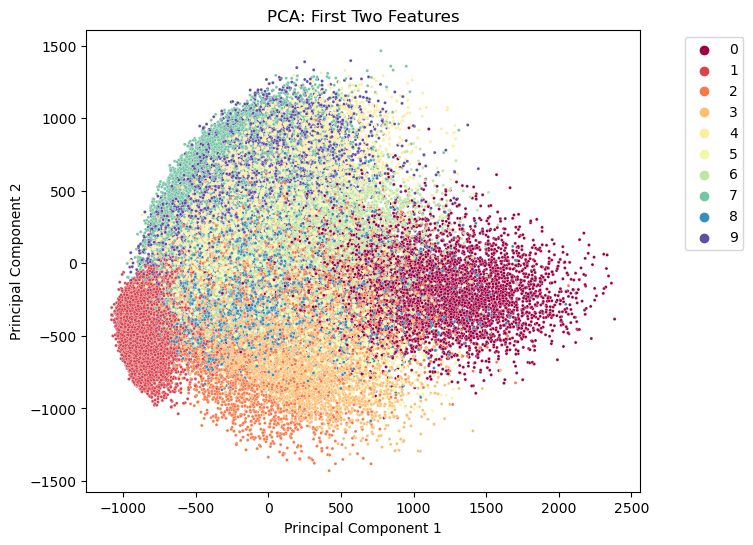

In [ ]:
# Visualize PCA
pca_data = pca_mnist(2)
visualize_clusters(pca_data, mnist.target.astype(int), 'PCA: First Two Features', dim=2)

##### TruncatedSVD


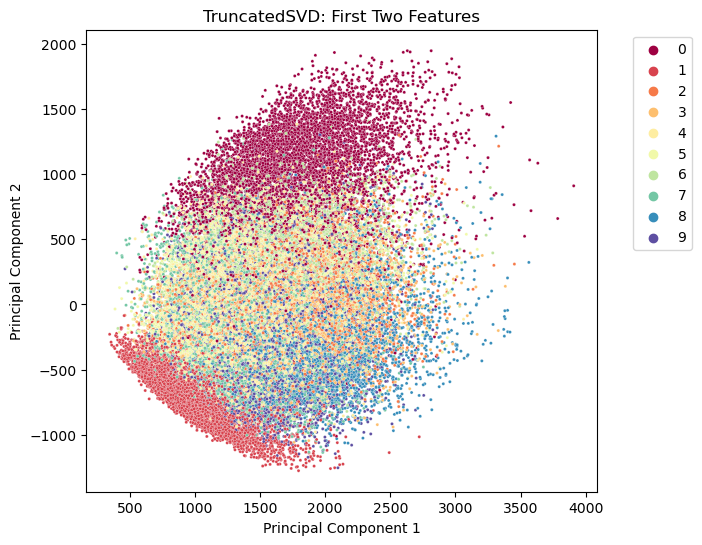

In [ ]:
# Visualize svd
svd_data = svd_mnist(2)
visualize_clusters(svd_data, mnist.target.astype(int), 'TruncatedSVD: First Two Features', dim=2)

##### t-SNE

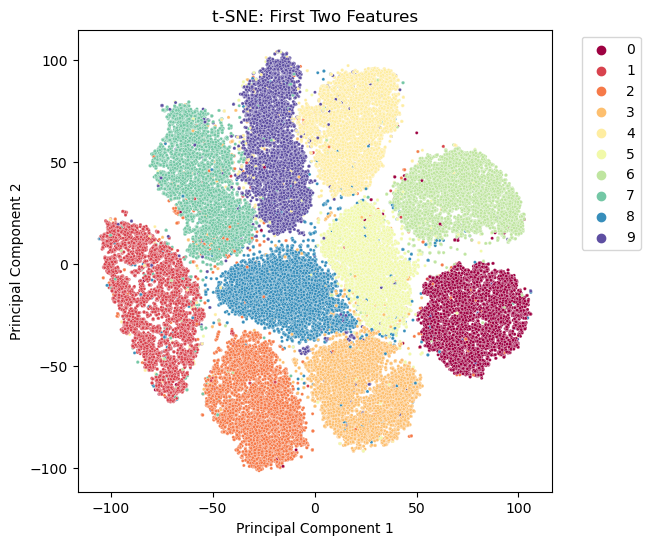

In [ ]:
# Visualize t-SNE
tsne_data = tsne_mnist(2)
visualize_clusters(tsne_data, mnist.target.astype(int), 't-SNE: First Two Features', dim=2)

##### UMAP

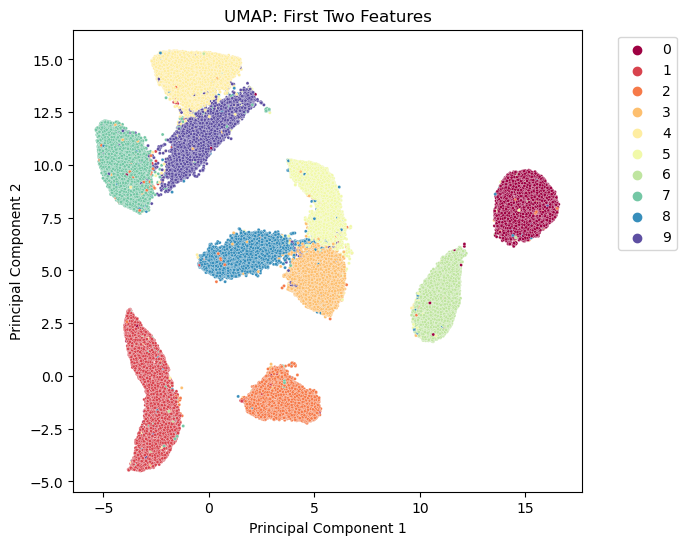

In [ ]:
# Visualize umap
umap_data = umap_mnist(2)
visualize_clusters(umap_data, mnist.target.astype(int), 'UMAP: First Two Features', dim=2)

#### Explore the tunable parameters of the algorithm and their effect on the results.

##### PCA

In [ ]:
def combined_score(explained_variance, reconstruction_error):
    """
    Define a combined score to assess the performance of dimensionality reduction.
    """

    return explained_variance - reconstruction_error

def hyperparam_tune_for_dimentionality_reduction(params, reduction_func, x_train, x_test, y_train, y_test):
    """
    Perform grid search-like cross-validation for dimensionality reduction.
    """

    # Initialize variables to store best hyperparameters and corresponding score
    best_params = None
    best_score = float('-inf')  # Initialize with a value less than any possible score

    # Initialize lists to store results
    param_names = list(params.keys())
    param_combinations = []
    explained_variances = []
    reconstruction_errors = []

    # Iterate over all combinations of hyperparameters
    for param_values in itertools.product(*params.values()):
        param_dict = dict(zip(params.keys(), param_values))

        # Apply dimensionality reduction
        reduction_model = reduction_func(**param_dict)
        if (reduction_func == TruncatedSVD):
          x_train_reduced = reduction_model.fit_transform(x_train.astype(float))
          x_test_reduced = reduction_model.transform(x_test.astype(float))
        else:
          x_train_reduced = reduction_model.fit_transform(x_train)
          x_test_reduced = reduction_model.transform(x_test)

        # Inverse transform the PCA data to the original space
        x_train_reconstructed = reduction_model.inverse_transform(x_train_reduced)
        x_test_reconstructed = reduction_model.inverse_transform(x_test_reduced)

        # Calculate reconstruction error
        train_reconstruction_error = mean_squared_error(x_train, x_train_reconstructed)
        test_reconstruction_error = mean_squared_error(x_test, x_test_reconstructed)

        # Calculate explained variance for each principal component
        explained_variance_ratio = reduction_model.explained_variance_ratio_

        # Cumulative explained variance
        cumulative_variance_ratio = explained_variance_ratio.cumsum()

        # Get the highest cumulative explained variance
        current_variance = cumulative_variance_ratio[-1]

        # Calculate the combined score
        score = combined_score(current_variance, test_reconstruction_error)

        # Append results to lists
        param_combinations.append(param_values)
        explained_variances.append(current_variance)
        reconstruction_errors.append(test_reconstruction_error)

        # Check if the current combination of hyperparameters gives a better result
        if score > best_score:
            best_score = score
            best_params = param_dict

    # Convert the results to a DataFrame
    results = pd.DataFrame(param_combinations, columns=param_names)
    results['explained_variance'] = explained_variances
    results['reconstruction_error'] = reconstruction_errors

    return best_params, results


In [ ]:
pca_params = {
    'n_components': [5, 10, 50, 100, 200],
    'svd_solver': ['auto', 'full', 'randomized']
    }

# Find the best parameters
best_pca_params, results_pca_df = hyperparam_tune_for_dimentionality_reduction(
    params=pca_params,
    reduction_func=PCA,
    x_train=x_train,
    x_test=x_test,
    y_train=y_train,
    y_test=y_test
)

print("Best PCA Parameters:")
print(best_pca_params)
print("\nResults DataFrame:")
print(results_pca_df)

Best PCA Parameters:
{'n_components': 200, 'svd_solver': 'full'}

Results DataFrame:
    n_components  svd_solver  explained_variance  reconstruction_error
0              5        auto            0.333790           2910.795847
1              5        full            0.333790           2910.796008
2              5  randomized            0.333790           2910.796125
3             10        auto            0.489385           2230.020240
4             10        full            0.489385           2230.019752
5             10  randomized            0.489385           2230.025007
6             50        auto            0.825593            765.088131
7             50        full            0.825614            765.071916
8             50  randomized            0.825583            765.158013
9            100        auto            0.914735            374.165359
10           100        full            0.915059            373.083830
11           100  randomized            0.914796            373

###### Visualization

In [ ]:
N_COMPONENTS = 200
pca = PCA(n_components=N_COMPONENTS, svd_solver='full')
pca_data = pca.fit_transform(x_train)

Find the number of n_components where most variance is

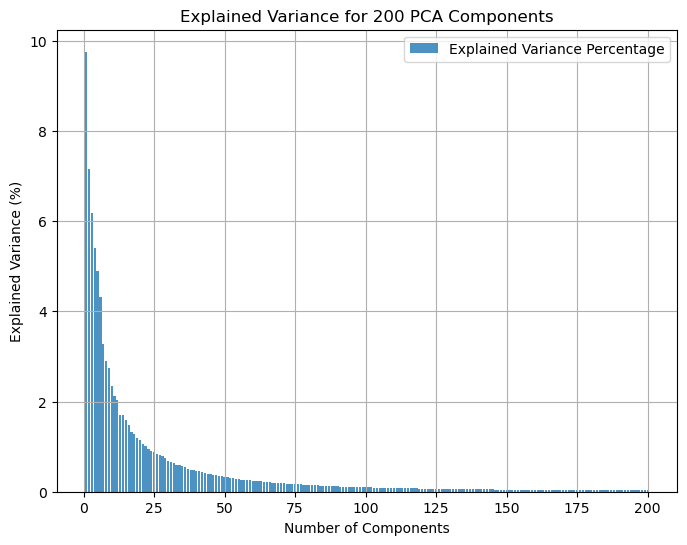

In [ ]:
plot_explained_variance_for_each_principle_component(pca, N_COMPONENTS)

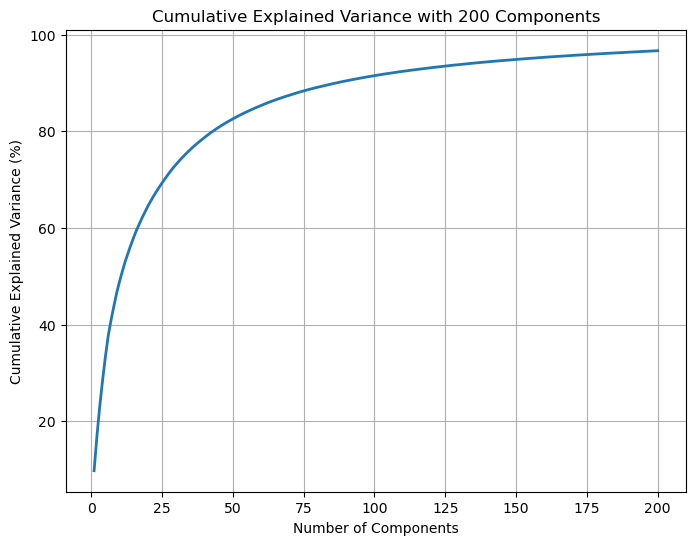

Cumulative Variance for first 200 principle components is: 96.6587%


In [ ]:
plot_cumulative_explained_variance(pca, N_COMPONENTS)

Visualize the variance with small number of n_components where most of the variance is (for better display)


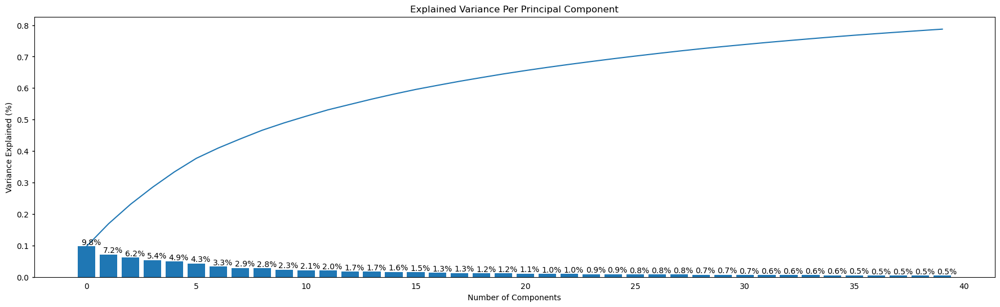

In [ ]:
pca = PCA(n_components=40)
pca.fit_transform(x_train)
scree_plot(pca)

Recostruct the digits after PCA with inverse_transformation

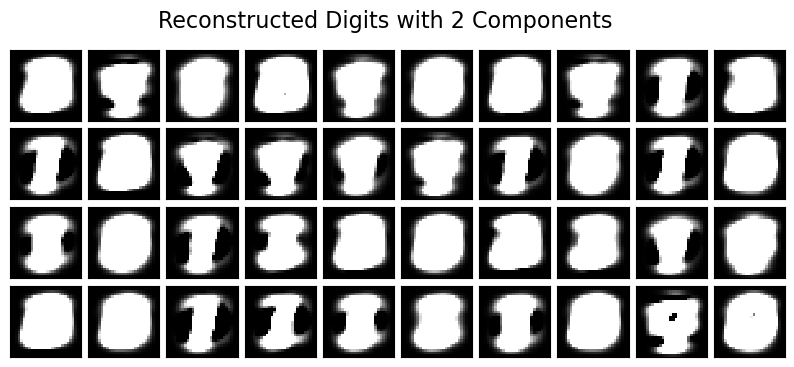

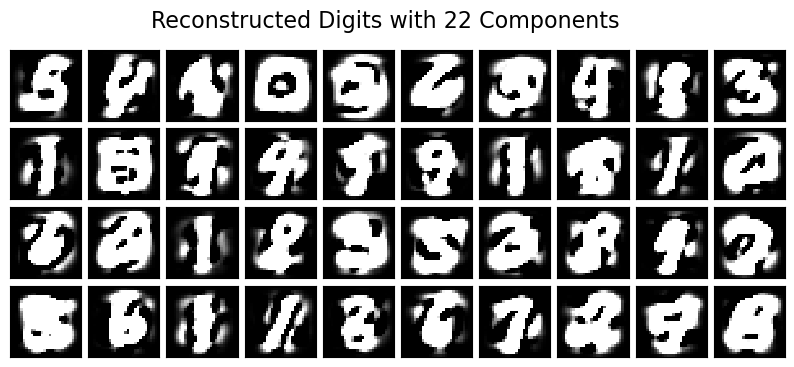

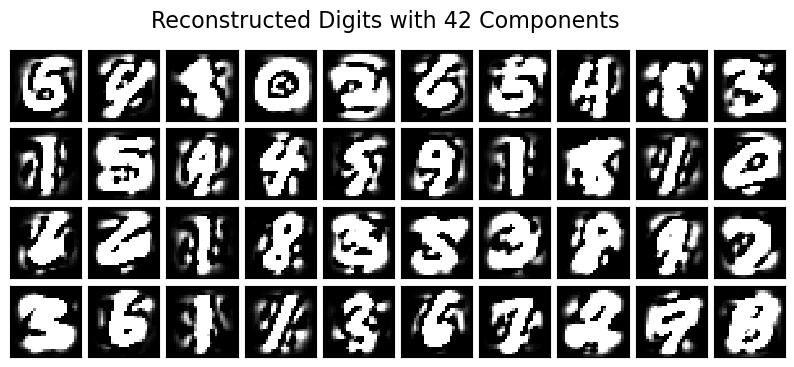

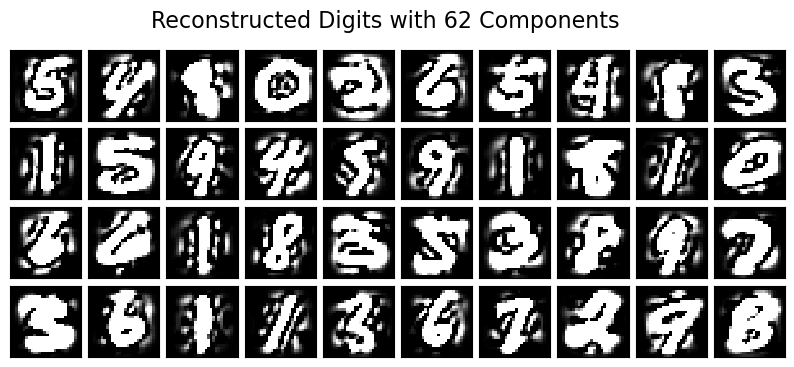

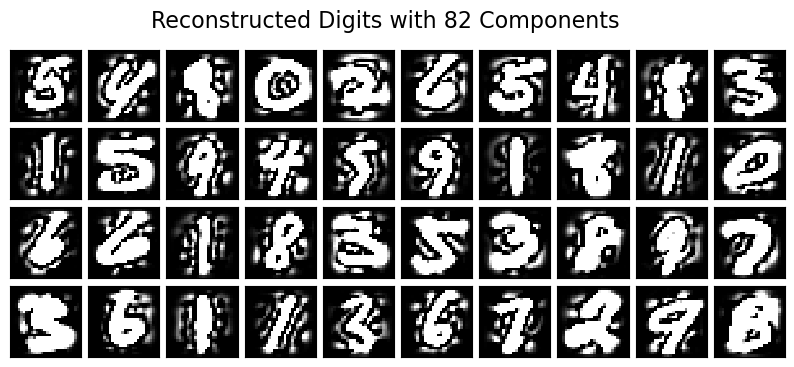

...

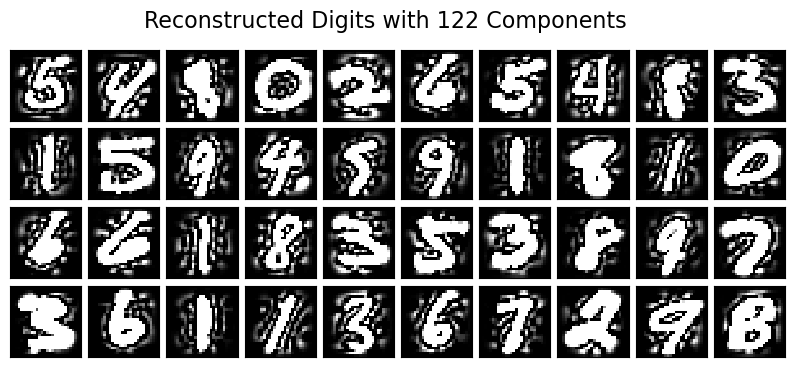

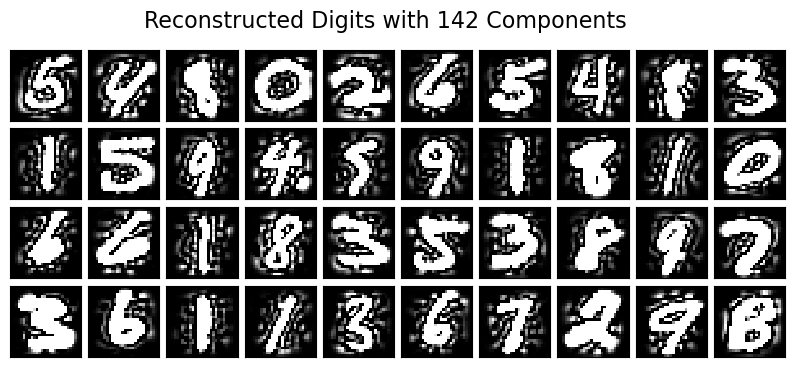

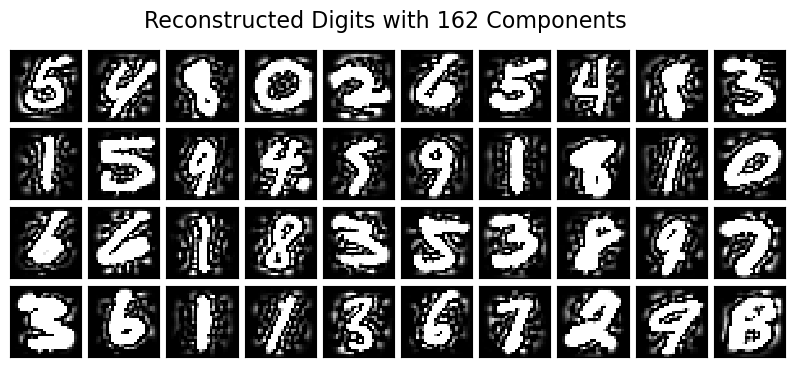

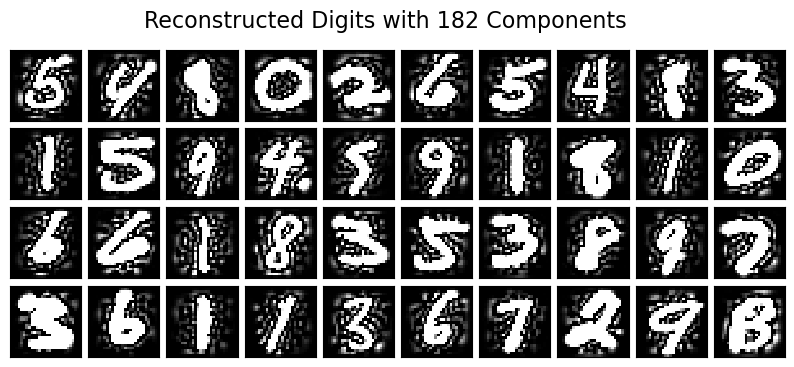

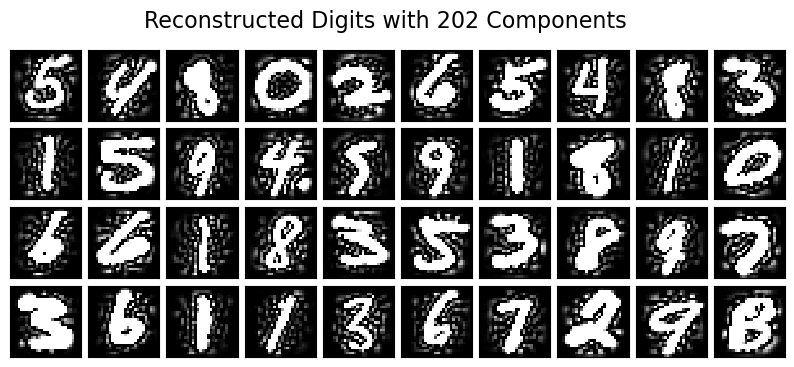

In [ ]:
# Recostruct the digits after PCA with inverse_transformation
for n_components in range(2, 220, 20):
    pca = PCA(n_components=n_components)
    components = pca.fit_transform(x_train)
    filtered = pca.inverse_transform(components)

    # Plot the reconstructed digits
    plot_digits(filtered)

    plt.suptitle(f'Reconstructed Digits with {n_components} Components', fontsize=16)

    # Show the plots
    plt.show()


##### TruncatedSVD

In [ ]:
# Example usage with TruncatedSVD
svd_params = {
    'n_components': [2, 50, 100, 200],
    'algorithm': ['arpack', 'randomized'],
    }

# Find the best parameters
best_svd_params, results_svd_df = hyperparam_tune_for_dimentionality_reduction(
    params=svd_params,
    reduction_func=TruncatedSVD,
    x_train=x_train,
    x_test=x_test,
    y_train=y_train,
    y_test=y_test
)

print("Best TSVD Parameters:")
print(best_svd_params)
print("\nResults DataFrame:")
print(results_svd_df)

Best TSVD Parameters:
{'n_components': 200, 'algorithm': 'arpack'}

Results DataFrame:
   n_components   algorithm  explained_variance  reconstruction_error
0             2      arpack            0.141222           3745.502384
1             2  randomized            0.141222           3745.502038
2            50      arpack            0.825462            765.907645
3            50  randomized            0.825336            766.475710
4           100      arpack            0.915027            373.196994
5           100  randomized            0.914872            373.929891
6           200      arpack            0.966584            147.488361
7           200  randomized            0.966394            148.335457


##### t-SNE

In [ ]:
def hyperparam_tune_for_dimentionality_reduction_tsne(params, reduction_func, x_train):
    results = []
    divergence = []

    for n_comp in params['n_components']:
        for perplexity_val in params['perplexity']:
            for learning_rate in params['learning_rate']:
                # Create t-SNE instance with specified parameters
                tsne = reduction_func(n_components=n_comp, perplexity=perplexity_val, learning_rate=learning_rate)

                # Fit on training data
                x_train_tsne = tsne.fit_transform(x_train)

                # Evaluate on validation set (you may want to use a more sophisticated metric)
                divergence.append(tsne.kl_divergence_)

                # Store results
                result = {
                    'n_components': n_comp,
                    'perplexity': perplexity_val,
                    'learning_rate': learning_rate,
                    'min_divergence': min(divergence)
                }
                results.append(result)

    # Create a DataFrame from the results
    results_df = pd.DataFrame(results)

    # Find the best parameters
    best_params = results_df.loc[results_df['min_divergence'].idxmin()].to_dict()

    # return best_params, results_df, divergence
    return best_params, results_df, divergence


In [ ]:
tsne_params = {
    'n_components': [2, 3],
    'perplexity': [20, 40, 80, 100, 150],
    'learning_rate': [10, 200, "auto"]
}

# Find the best parameters
best_tsne_params, results_tsne_df, divergence = hyperparam_tune_for_dimentionality_reduction_tsne(
    params=tsne_params,
    reduction_func=TSNE,
    x_train=x_train,
)

print("Best t-SNE Parameters:")
print(best_tsne_params)
print("\nResults DataFrame:")
print(results_tsne_df)

Best t-SNE Parameters:
{'n_components': 3, 'perplexity': 150, 'learning_rate': 'auto', 'min_divergence': 1.925107717514038}

Results DataFrame:
    n_components  perplexity learning_rate  min_divergence
0              2          20            10        4.388719
1              2          20           200        3.163320
2              2          20          auto        2.801871
3              2          40            10        2.801871
4              2          40           200        2.801871
5              2          40          auto        2.598008
6              2          80            10        2.598008
7              2          80           200        2.585596
8              2          80          auto        2.383428
9              2         100            10        2.383428
10             2         100           200        2.383428
11             2         100          auto        2.298859
12             2         150            10        2.298859
13             2         150  

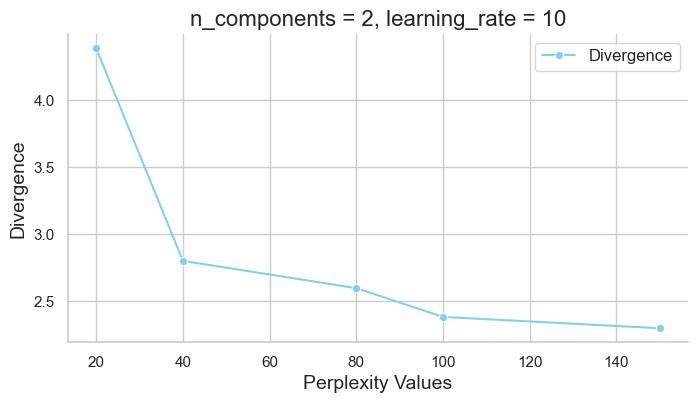

In [ ]:
plot_filtered_results(results_tsne_df, n_components=2, learning_rate=10)

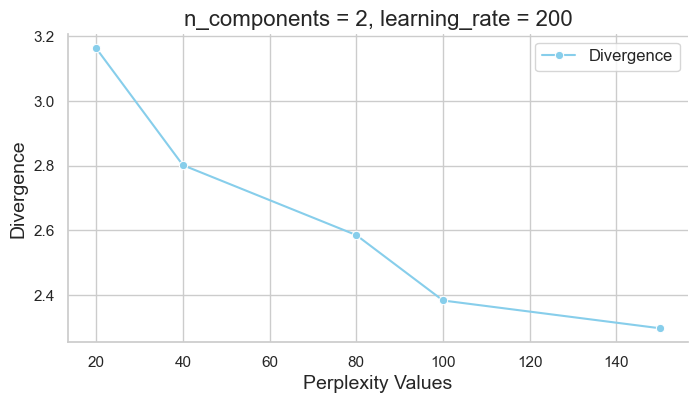

In [ ]:
plot_filtered_results(results_tsne_df, n_components=2, learning_rate=200)

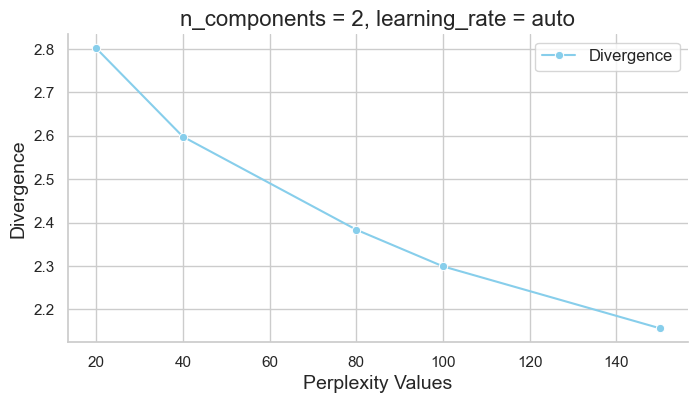

In [ ]:
plot_filtered_results(results_tsne_df, n_components=2, learning_rate='auto')

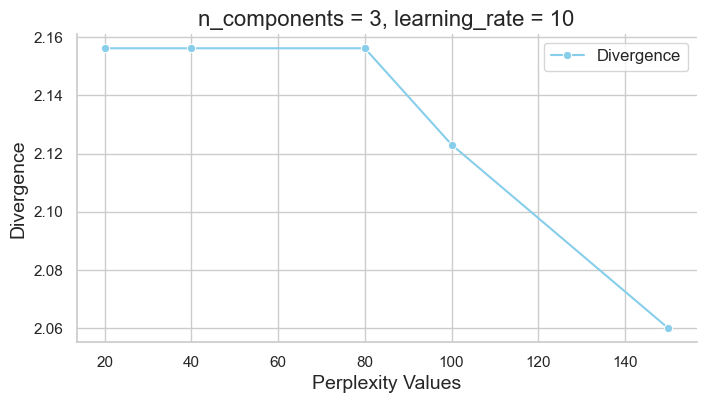

In [ ]:
plot_filtered_results(results_tsne_df, n_components=3, learning_rate=10)

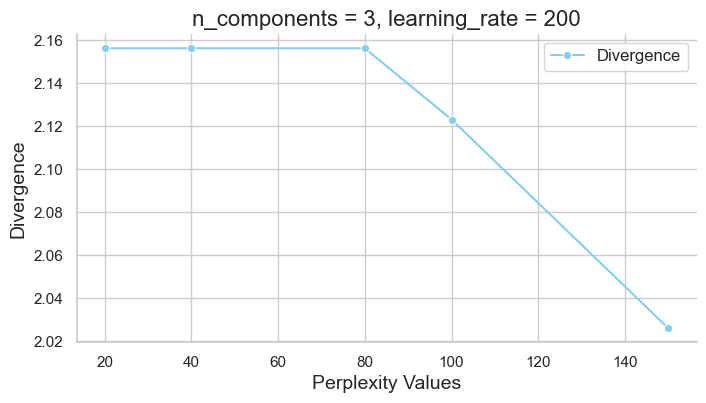

In [ ]:
plot_filtered_results(results_tsne_df, n_components=3, learning_rate=200)

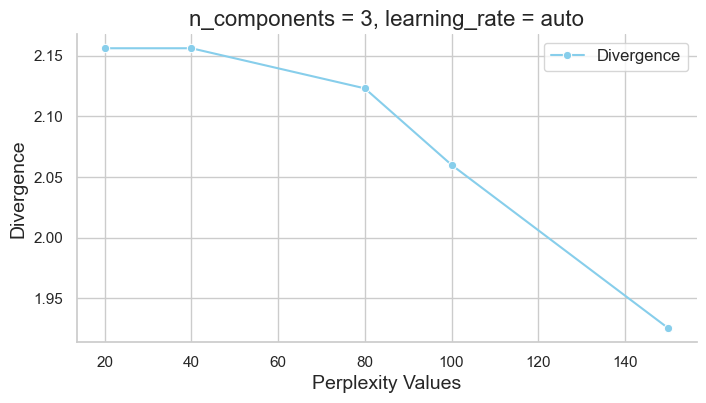

In [ ]:
plot_filtered_results(results_tsne_df, n_components=3, learning_rate='auto')

#### Best Dimentionality Reduction

t-SNE

In [ ]:
tsne = TSNE(n_components=2, perplexity=150, random_state=42, learning_rate='auto') # best dr with 2 components so it can be visualized
x_train_tsne = tsne.fit_transform(x_train)

PCA

In [ ]:
pca = PCA(n_components=200, svd_solver='full')
x_train_pca = pca.fit_transform(x_train)
x_test_pca = pca.transform(x_test)

##### Compare t-SNE and PCA on digits reconstruction on dim=2

In [ ]:
def plot_tsne_with_digits(transformed_data, x_train, y_train, x_min=-90, x_max=90, y_min=-90, y_max=90):
    # Set custom x and y limits
    corners = np.array([[x_min, y_min], [x_max, y_min], [x_min, y_max], [x_max, y_max]])

    # Create a grid of test points excluding points in the margins
    test_pts = np.array([
        [(1 - x) * corners[0, 0] + x * corners[1, 0], (1 - y) * corners[0, 1] + y * corners[2, 1]]
        for y in np.linspace(0.1, 0.9, 10)  # Adjusted margins to avoid edges
        for x in np.linspace(0.1, 0.9, 10)
    ])

    # Set up the figure
    fig = plt.figure(figsize=(12, 6))
    gs = GridSpec(10, 20, fig)
    scatter_ax = fig.add_subplot(gs[:, :10])
    digit_axes = np.zeros((10, 10), dtype=object)

    # Scatter plot
    scatter_ax.set_xlabel('Component 1', fontsize=14)
    scatter_ax.set_ylabel('Component 2', fontsize=14)

    scatter = scatter_ax.scatter(transformed_data[:, 0], transformed_data[:, 1],
                       c=y_train.astype(np.int32), cmap='Spectral', s=0.3)
    scatter_ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max), xticks=[], yticks=[])

    # Plot the locations of the text points
    scatter_ax.scatter(test_pts[:, 0], test_pts[:, 1], marker='x', c='k', s=18)

    inv_transformed_points = []
    for point in test_pts:
        inv_transformed_points.append(np.array(x_train.iloc[np.argmin(cdist([np.array(point)], transformed_data, metric='euclidean')[0])]))

    # Plot each of the generated digit images
    for i in range(10):
        for j in range(10):
            digit_axes[i, j] = fig.add_subplot(gs[i, 10 + j])
            digit_axes[i, j].imshow(inv_transformed_points[i*10 + j].reshape(28, 28))
            digit_axes[i, j].set(xticks=[], yticks=[])

    # Add a colorbar as a legend
    cbar = plt.colorbar(scatter, ax=scatter_ax, orientation='vertical', pad=0.01)
    cbar.set_label('Classes', fontsize=14)

    plt.show()


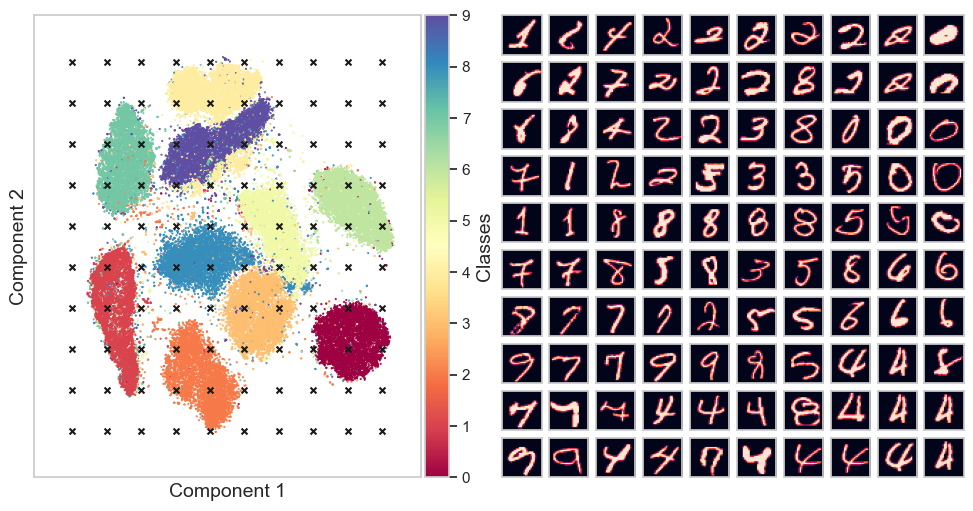

In [ ]:
plot_tsne_with_digits(x_train_tsne, x_train, y_train)

In [ ]:
def plot_pca_with_digits(transformed_data, y_train, x_min=-1500, x_max=2500, y_min=-1500, y_max=1500):
    # Set custom x and y limits
    corners = np.array([[x_min, y_min], [x_max, y_min], [x_min, y_max], [x_max, y_max]])

    # Create a grid of test points excluding points in the margins
    test_pts = np.array([
        [(1 - x) * corners[0, 0] + x * corners[1, 0], (1 - y) * corners[0, 1] + y * corners[2, 1]]
        for y in np.linspace(0.1, 0.9, 10)
        for x in np.linspace(0.1, 0.9, 10)
    ])

    # Inverse transform the test points
    n_components = pca.n_components_
    test_pts_padded = np.pad(test_pts, ((0,0), (0,n_components-2)), 'constant', constant_values=0)
    inv_transformed_points = pca.inverse_transform(test_pts_padded)

    # Set up the figure
    fig = plt.figure(figsize=(12, 6))
    gs = GridSpec(10, 20, fig)
    scatter_ax = fig.add_subplot(gs[:, :10])
    digit_axes = np.zeros((10, 10), dtype=object)

    # Scatter plot
    scatter_ax.set_xlabel('Component 1', fontsize=14)
    scatter_ax.set_ylabel('Component 2', fontsize=14)
    scatter = scatter_ax.scatter(transformed_data[:, 0], transformed_data[:, 1],
                       c=y_train.astype(np.int32), cmap='Spectral', s=0.5)
    scatter_ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max), xticks=[], yticks=[])

    # Plot the locations of the text points
    scatter_ax.scatter(test_pts[:, 0], test_pts[:, 1], marker='x', c='k', s=18)

    # Plot each of the generated digit images
    for i in range(10):
        for j in range(10):
            digit_axes[i, j] = fig.add_subplot(gs[i, 10 + j])
            digit_axes[i, j].imshow(inv_transformed_points[i * 10 + j].reshape(28, 28))
            digit_axes[i, j].set(xticks=[], yticks=[])

    # Add a colorbar as a legend
    cbar = plt.colorbar(scatter, ax=scatter_ax, orientation='vertical', pad=0.01)
    cbar.set_label('Classes', fontsize=14)

    plt.show()

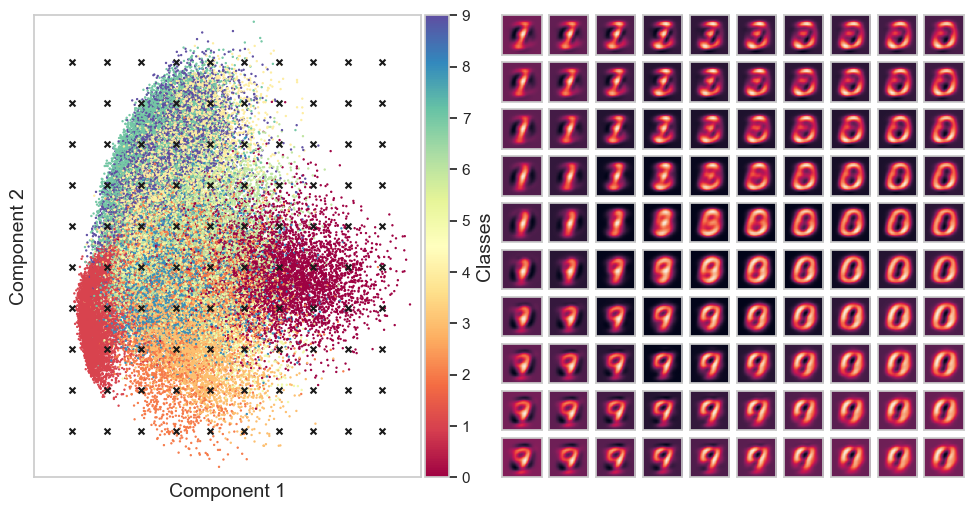

In [ ]:
plot_pca_with_digits(x_train_pca, y_train)


## Part 2: Clustering the raw data
(5) For two different clustering methods of your choice perform:
* Cluster the data using the raw pixel level values without using the digit labels.
* Visualize the clustering results using the selected dimensionality reduction model from (4).
* Evaluate the clustering result using standard evaluation metrics. You may use the digit
labels as external data for evaluation.
* Explore the tunable parameters of the algorithm and their effect on the clustering results.

(6) Select one clustering result as the “best” to be used in the following sections.

In [ ]:
def evaluate_clustering(data, true_labels, predicted_labels, algorithm_name):
    homogeneity = homogeneity_score(true_labels, predicted_labels)
    completeness = completeness_score(true_labels, predicted_labels)
    v_measure = v_measure_score(true_labels, predicted_labels)
    silhouette_avg = silhouette_score(data, predicted_labels)

    print(f"{algorithm_name} Clustering Results:")
    print(f"Homogeneity Score: {homogeneity}")
    print(f"Completeness Score: {completeness}")
    print(f"V-Measure: {v_measure}")
    print(f"Silhouette Score: {silhouette_avg}\n")

In [ ]:
def plot_clustering_metrics_heatmap(algorithm, homogeneity_arr, completeness_arr, v_measure_arr, silhouette_arr, param1, param2):
    homogeneity_values = np.array(homogeneity_arr).reshape(len(param1), len(param2))
    completeness_values = np.array(completeness_arr).reshape(len(param1), len(param2))
    v_measure_values = np.array(v_measure_arr).reshape(len(param1), len(param2))
    silhouette_values = np.array(silhouette_arr).reshape(len(param1), len(param2))

    plt.figure(figsize=(12, 8))

    # Homogeneity heatmap
    plt.subplot(2, 2, 1)
    sns.heatmap(homogeneity_values, annot=True, fmt=".4f", cmap="YlGnBu", xticklabels=param2, yticklabels=param1)
    plt.title(f'Homogeneity Heatmap for {algorithm}')
    plt.xlabel(f'{param2}')
    plt.ylabel(f'{param1}')

    # Completeness heatmap
    plt.subplot(2, 2, 2)
    sns.heatmap(completeness_values, annot=True, fmt=".4f", cmap="YlGnBu", xticklabels=param2, yticklabels=param1)
    plt.title(f'Completeness Heatmap for {algorithm}')
    plt.xlabel(f'{param2}')
    plt.ylabel(f'{param1}')

    # V-Measure heatmap
    plt.subplot(2, 2, 3)
    sns.heatmap(v_measure_values, annot=True, fmt=".4f", cmap="YlGnBu", xticklabels=param2, yticklabels=param1)
    plt.title(f'V-Measure Heatmap for {algorithm}')
    plt.xlabel(f'{param2}')
    plt.ylabel(f'{param1}')

    # Silhouette heatmap
    plt.subplot(2, 2, 4)
    sns.heatmap(silhouette_values, annot=True, fmt=".4f", cmap="YlGnBu", xticklabels=param2, yticklabels=param1)
    plt.title(f'Silhouette Heatmap for {algorithm}')
    plt.xlabel(f'{param2}')
    plt.ylabel(f'{param1}')

    plt.tight_layout()
    plt.show()



### For two different clustering methods of your choice perform:

#### Cluster the data using the raw pixel level values without using the digit labels and evaluate the results

Without Dimentionality Reduction

In [ ]:
kmeans = KMeans(n_clusters=10, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(x_train)

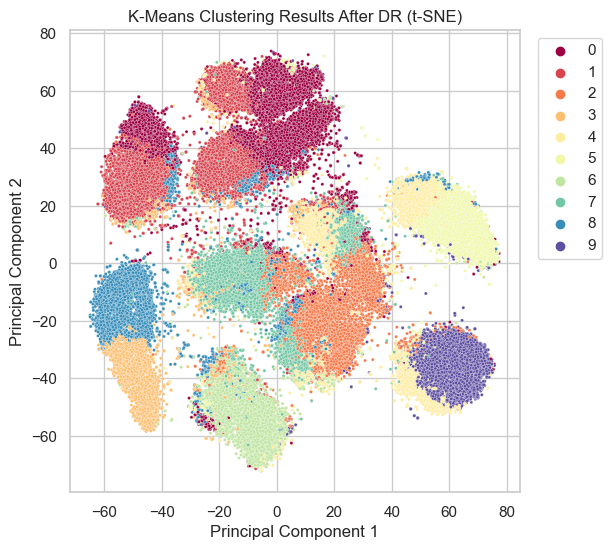

In [ ]:
visualize_clusters(x_train_tsne, kmeans_labels, 'K-Means Clustering Results After DR (t-SNE)', dim=2)

In [ ]:
gmm = GaussianMixture(n_components=10)
gmm_labels = gmm.fit_predict(x_train)

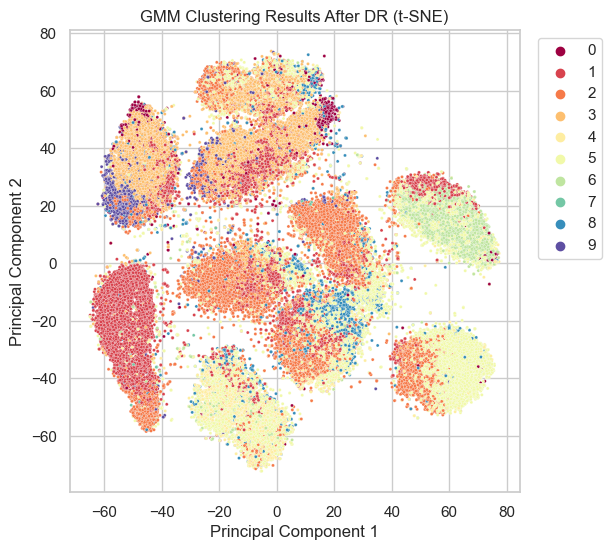

In [ ]:
visualize_clusters(x_train_tsne, gmm_labels, 'GMM Clustering Results After DR (t-SNE)', dim=2)

In [ ]:
# Assuming kmeans_labels and gmm_labels contain cluster assignments from KMeans and GMM, respectively
evaluate_clustering(x_train, y_train, kmeans_labels, "K-Means")
evaluate_clustering(x_train, y_train, gmm_labels, "GMM")

K-Means Clustering Results:
Homogeneity Score: 0.4942960979306923
Completeness Score: 0.5015483740387849
V-Measure: 0.49789582849329367
Silhouette Score: 0.05934268085282286

GMM Clustering Results:
Homogeneity Score: 0.2776970887743926
Completeness Score: 0.3375531507826602
V-Measure: 0.30471350111608025
Silhouette Score: -0.005767121342895913



#### Visualize the clustering results using the selected dimensionality reduction model from (4) and evaluate results


##### PCA

In [ ]:
kmeans = KMeans(n_clusters=10, random_state=42, n_init=10)
kmeans_labels_pca = kmeans.fit_predict(x_train_pca)

In [ ]:
gmm = GaussianMixture(n_components=10)
gmm_labels_pca = gmm.fit_predict(x_train_pca)

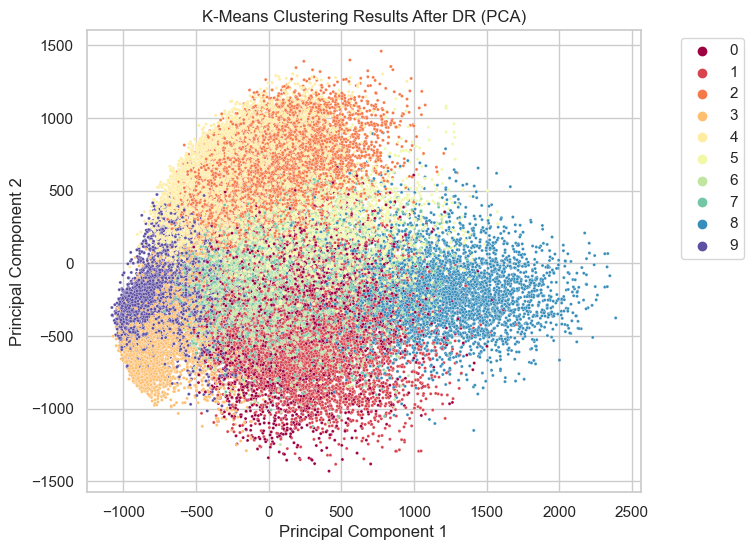

In [ ]:
visualize_clusters(x_train_pca, kmeans_labels_pca, 'K-Means Clustering Results After DR (PCA)', dim=2)

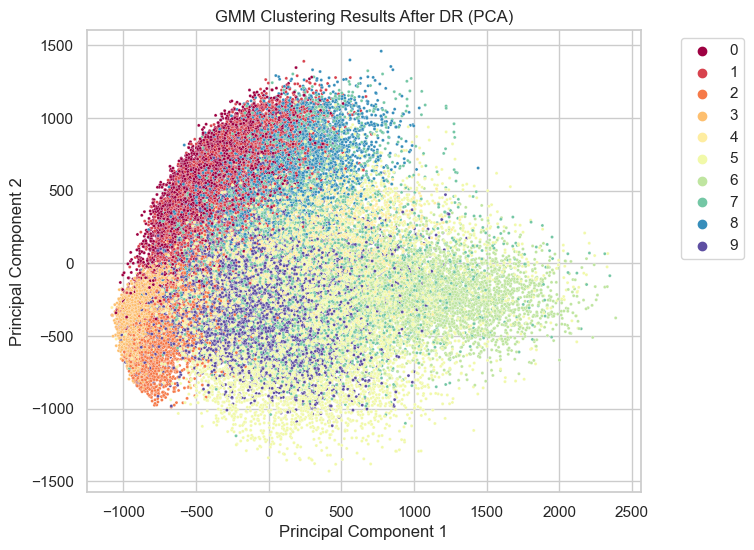

In [ ]:
visualize_clusters(x_train_pca, gmm_labels_pca, 'GMM Clustering Results After DR (PCA)', dim=2)

In [ ]:
# Assuming kmeans_labels and gmm_labels contain cluster assignments from KMeans and GMM, respectively
evaluate_clustering(x_train_pca, y_train, kmeans_labels_pca, "K-Means")
evaluate_clustering(x_train_pca, y_train, gmm_labels_pca, "GMM")

K-Means Clustering Results:
Homogeneity Score: 0.49359140992084394
Completeness Score: 0.5008763211001739
V-Measure: 0.4972071829298503
Silhouette Score: 0.064028092208815

GMM Clustering Results:
Homogeneity Score: 0.449864327928139
Completeness Score: 0.4674571345187562
V-Measure: 0.45849202981592285
Silhouette Score: 0.006953282769405354



##### t-SNE

In [ ]:
kmeans = KMeans(n_clusters=10, random_state=42, n_init=10)
kmeans_labels_tsne = kmeans.fit_predict(x_train_tsne)

In [ ]:
gmm = GaussianMixture(n_components=10)
gmm_labels_tsne = gmm.fit_predict(x_train_tsne)

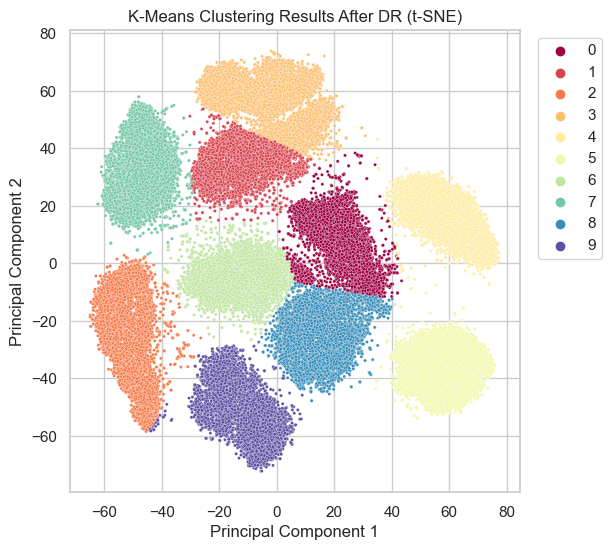

In [ ]:
visualize_clusters(x_train_tsne, kmeans_labels_tsne, 'K-Means Clustering Results After DR (t-SNE)', dim=2)

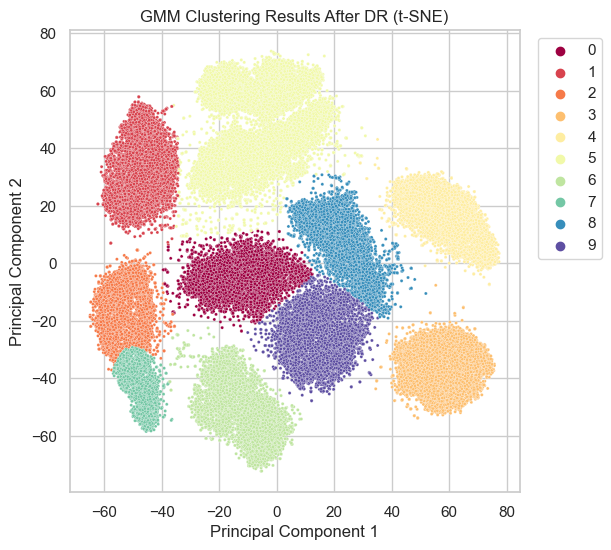

In [ ]:
visualize_clusters(x_train_tsne, gmm_labels_tsne, 'GMM Clustering Results After DR (t-SNE)', dim=2)

In [ ]:
evaluate_clustering(x_train_tsne, y_train, kmeans_labels_tsne, "K-Means")
evaluate_clustering(x_train_tsne, y_train, gmm_labels_tsne, "GMM")

K-Means Clustering Results:
Homogeneity Score: 0.833619009546723
Completeness Score: 0.8356494288122224
V-Measure: 0.834632984326438
Silhouette Score: 0.5026912689208984

GMM Clustering Results:
Homogeneity Score: 0.8328411597265314
Completeness Score: 0.8568166425184457
V-Measure: 0.8446588004741971
Silhouette Score: 0.5050132274627686



#### Explore the tunable parameters of the algorithm and their effect on the clustering results.

##### K-Means


Homogeneity: 0.4943248280434626, Completeness: 0.5015739688111934, V-Measure: 0.497923015203432, Silhouette: 0.059340013700627865 (inits=random, algorithm=lloyd)


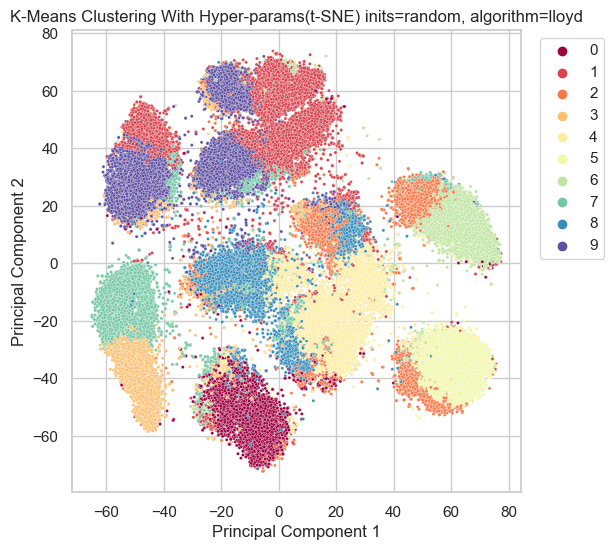


Homogeneity: 0.4942960979306923, Completeness: 0.5015483740387849, V-Measure: 0.49789582849329367, Silhouette: 0.05934268085282286 (inits=k-means++, algorithm=lloyd)


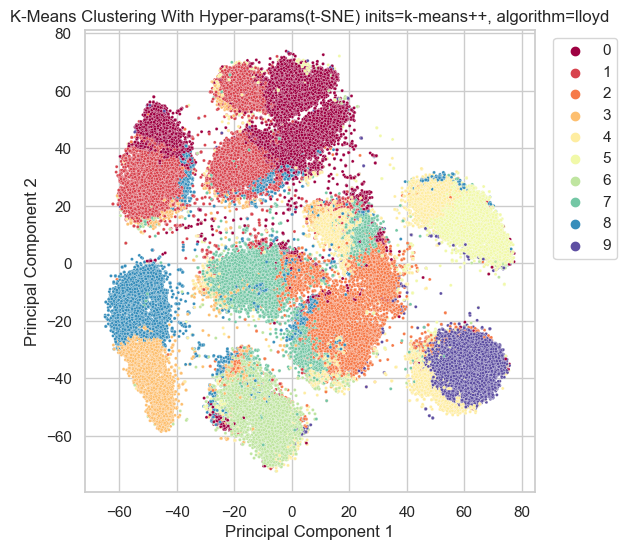


Homogeneity: 0.4943248280434626, Completeness: 0.5015739688111934, V-Measure: 0.497923015203432, Silhouette: 0.059340013700627865 (inits=random, algorithm=elkan)


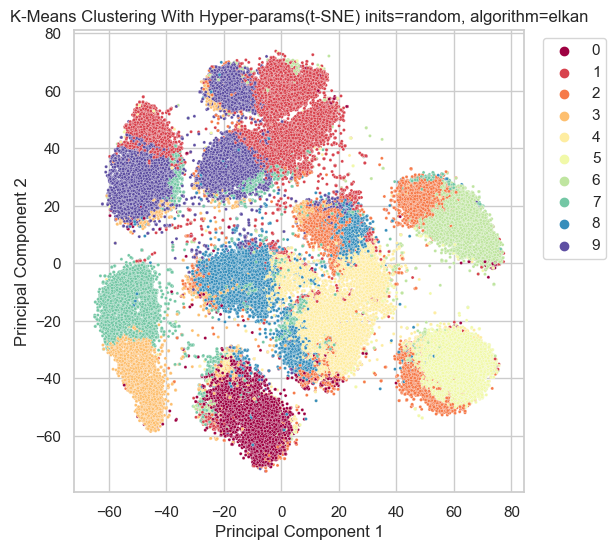


Homogeneity: 0.4942960979306923, Completeness: 0.5015483740387849, V-Measure: 0.49789582849329367, Silhouette: 0.05934268085282286 (inits=k-means++, algorithm=elkan)


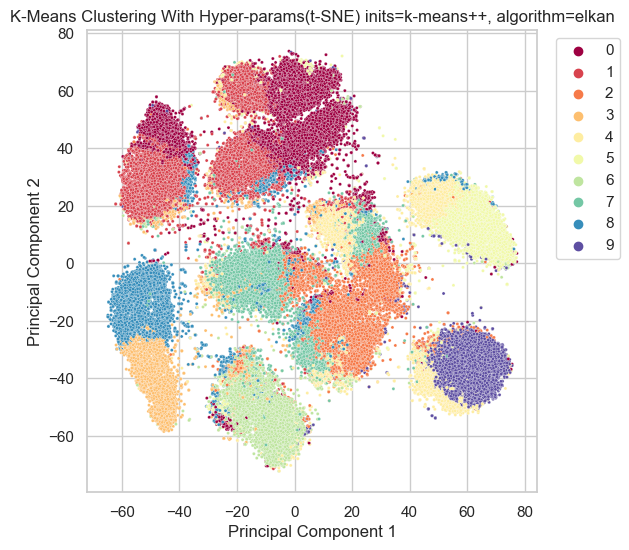

In [ ]:
best_kmeans_labels = None
best_homogeneity_kmeans = -1
best_completeness_kmeans = -1
best_v_measure_kmeans = -1
best_silhouette_kmeans = -1

algorithms = ["lloyd", "elkan"]
inits = ['random', 'k-means++']

homogeneity_kmeans_arr = []
completeness_kmeans_arr = []
v_measure_kmeans_arr = []
silhouette_kmeans_arr = []

for algo in algorithms:
    for init in inits :
        kmeans = KMeans(n_clusters=10, random_state=42, algorithm=algo, init=init , n_init=10) # default n_init=10, is set to supress warnings
        kmeans_labels = kmeans.fit_predict(x_train)

        homogeneity_kmeans = homogeneity_score(y_train, kmeans_labels)
        completeness_kmeans = completeness_score(y_train, kmeans_labels)
        v_measure_kmeans = v_measure_score(y_train, kmeans_labels)
        silhouette_kmeans = silhouette_score(x_train, kmeans_labels)

        homogeneity_kmeans_arr.append(homogeneity_kmeans)
        completeness_kmeans_arr.append(completeness_kmeans)
        v_measure_kmeans_arr.append(v_measure_kmeans)
        silhouette_kmeans_arr.append(silhouette_kmeans)

        print(f"\nHomogeneity: {homogeneity_kmeans}, Completeness: {completeness_kmeans}, V-Measure: {v_measure_kmeans}, Silhouette: {silhouette_kmeans} (inits={init}, algorithm={algo})")

        if silhouette_kmeans > best_silhouette_kmeans:
          best_silhouette_kmeans = silhouette_kmeans
          best_kmeans_params = {
              'algorithm': algo,
              'init': init
          }

          best_kmeans_labels = kmeans_labels
          best_homogeneity_kmeans = homogeneity_kmeans
          best_completeness_kmeans = completeness_kmeans
          best_v_measure_kmeans = v_measure_kmeans

        # Visualize clustering results
        visualize_clusters(x_train_tsne, kmeans_labels, f"K-Means Clustering With Hyper-params(t-SNE) inits={init}, algorithm={algo}", dim=2)

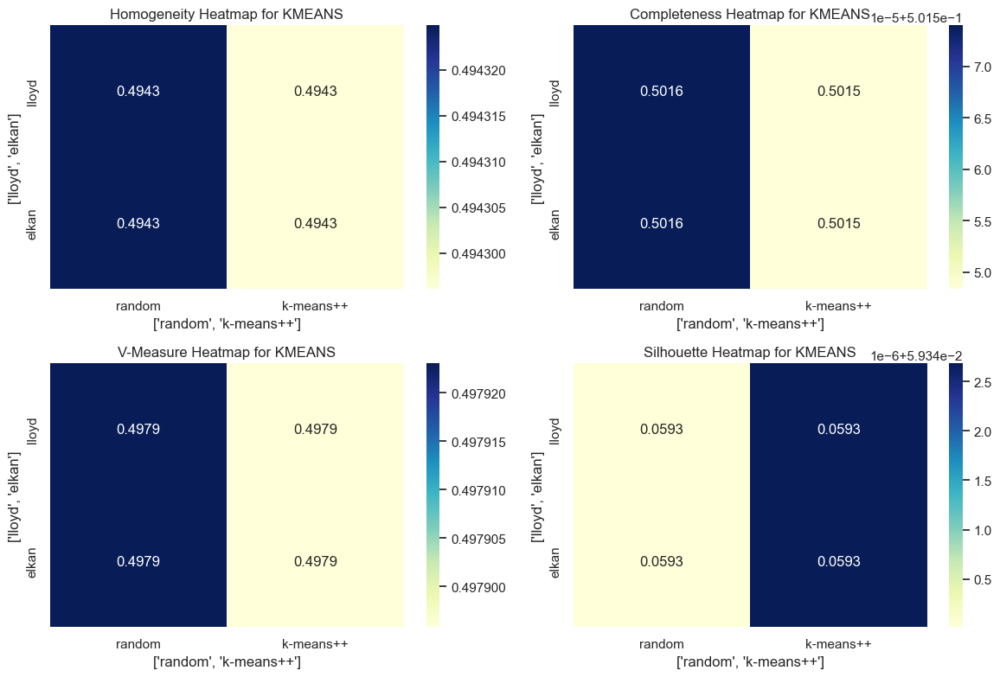

In [ ]:
# Plot the clustering metrices for evaluation
plot_clustering_metrics_heatmap('KMEANS', homogeneity_kmeans_arr, completeness_kmeans_arr, v_measure_kmeans_arr, silhouette_kmeans_arr, algorithms, inits)

##### GMM



Homogeneity: 0.2690291857047186, Completeness: 0.35726532305072267, V-Measure: 0.30693163550760294, Silhouette: -0.0019336605723639945 (gmm_init_method=k-means++, tol=0.001)


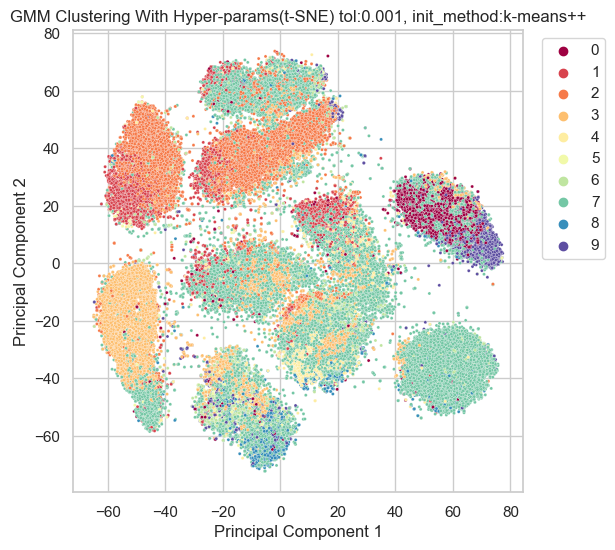


Homogeneity: 0.2621726636742936, Completeness: 0.3195620230581185, V-Measure: 0.2880365524183725, Silhouette: -0.0019206762660158123 (gmm_init_method=random_from_data, tol=0.001)


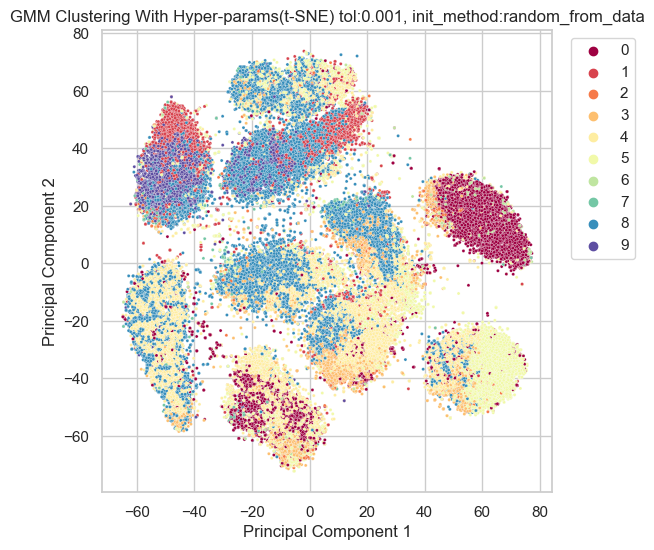


Homogeneity: 0.26912229416807576, Completeness: 0.3574080533638917, V-Measure: 0.30704490422318725, Silhouette: -0.0019376924978206035 (gmm_init_method=k-means++, tol=0.1)


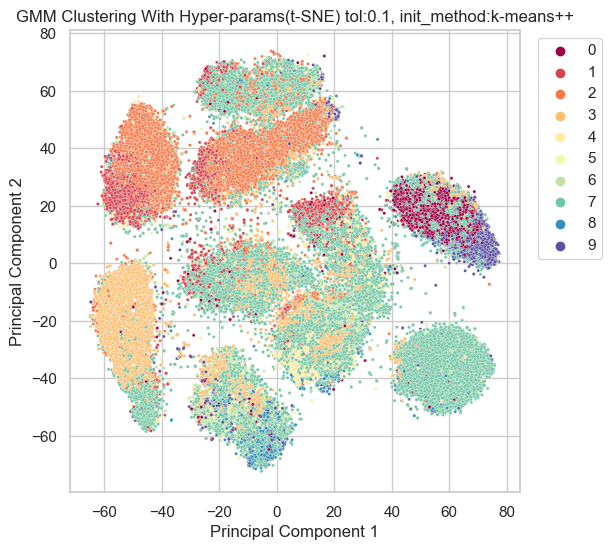


Homogeneity: 0.26330611695543654, Completeness: 0.320888166955427, V-Measure: 0.28925930822997603, Silhouette: -0.0016522036063128537 (gmm_init_method=random_from_data, tol=0.1)


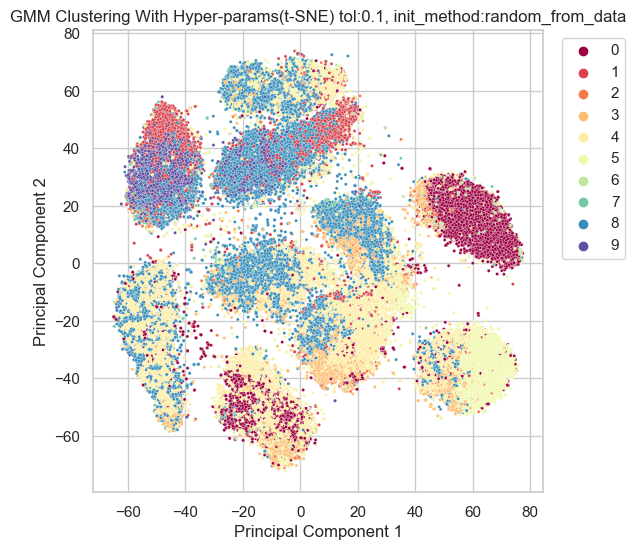


Homogeneity: 0.2690291857047186, Completeness: 0.35726532305072267, V-Measure: 0.30693163550760294, Silhouette: -0.0019336605723639945 (gmm_init_method=k-means++, tol=1e-06)


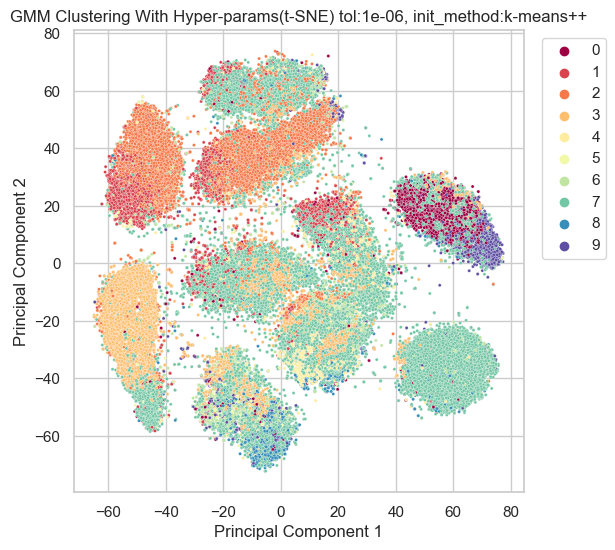


Homogeneity: 0.26202880215784313, Completeness: 0.31943968625245095, V-Measure: 0.28790003248239693, Silhouette: -0.0019388721742189315 (gmm_init_method=random_from_data, tol=1e-06)


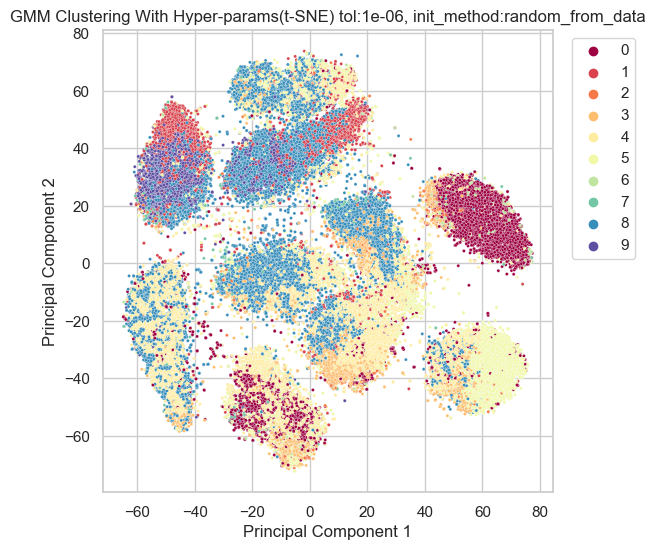

In [ ]:
best_gmm_labels = None
best_homogeneity_gmm = -1
best_completeness_gmm = -1
best_v_measure_gmm = -1
best_silhouette_gmm = -1

initializations = ["k-means++", "random_from_data"]
tols = [1e-3, 1e-1, 1e-6]

homogeneity_gmm_arr = []
completeness_gmm_arr = []
v_measure_gmm_arr = []
silhouette_gmm_arr = []

for tol in tols:
    for initialization in initializations:
        gmm = GaussianMixture(n_components=10, tol=tol, init_params=initialization, random_state=42, max_iter=300)
        gmm_labels = gmm.fit_predict(x_train)

        homogeneity_gmm = homogeneity_score(y_train, gmm_labels)
        completeness_gmm = completeness_score(y_train, gmm_labels)
        v_measure_gmm = v_measure_score(y_train, gmm_labels)
        silhouette_gmm = silhouette_score(x_train, gmm_labels)

        homogeneity_gmm_arr.append(homogeneity_gmm)
        completeness_gmm_arr.append(completeness_gmm)
        v_measure_gmm_arr.append(v_measure_gmm)
        silhouette_gmm_arr.append(silhouette_gmm)

        print(f"\nHomogeneity: {homogeneity_gmm}, Completeness: {completeness_gmm}, V-Measure: {v_measure_gmm}, Silhouette: {silhouette_gmm} (gmm_init_method={initialization}, tol={tol})")

        if silhouette_gmm > best_silhouette_gmm:
          best_silhouette_gmm = silhouette_gmm
          best_gmm_params = {
              'init_params': initialization,
              'tol': tol
          }

          best_gmm_labels = gmm_labels
          best_completeness_gmm = completeness_gmm
          best_v_measure_gmm = v_measure_gmm
          best_homogeneity_gmm = homogeneity_gmm

         # Visualize clustering results
        visualize_clusters(x_train_tsne, gmm_labels, f"GMM Clustering With Hyper-params(t-SNE) tol:{tol}, init_method:{initialization}", dim=2)

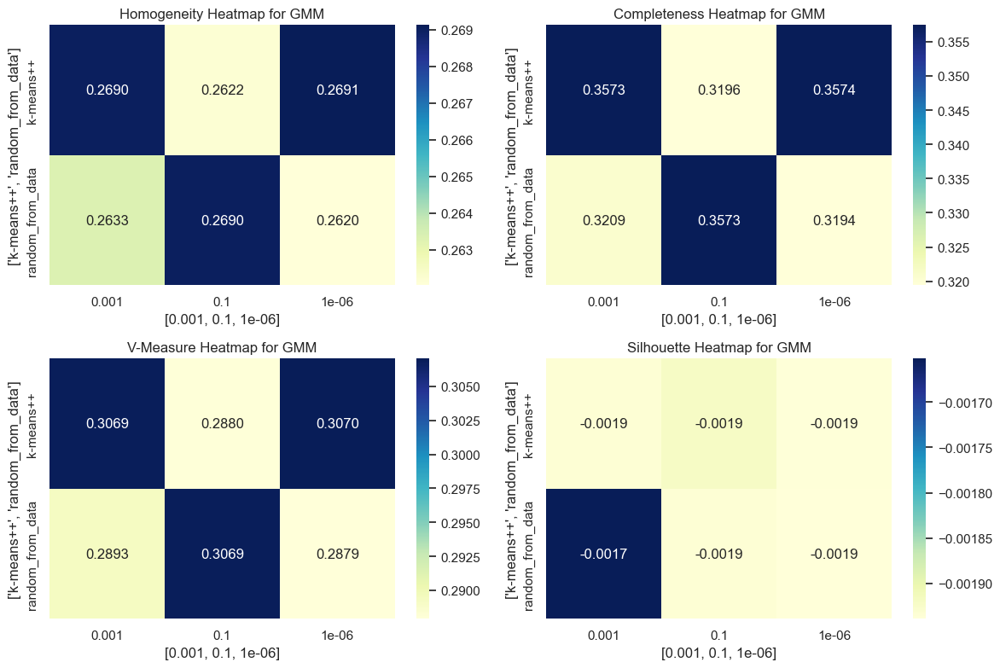

In [ ]:
# Plot the clustering metrices for evaluation
plot_clustering_metrics_heatmap('GMM', homogeneity_gmm_arr, completeness_gmm_arr, v_measure_gmm_arr, silhouette_gmm_arr, initializations, tols)

##### Visualize best clustering results

Best Parameters: {'algorithm': 'lloyd', 'init': 'k-means++'}


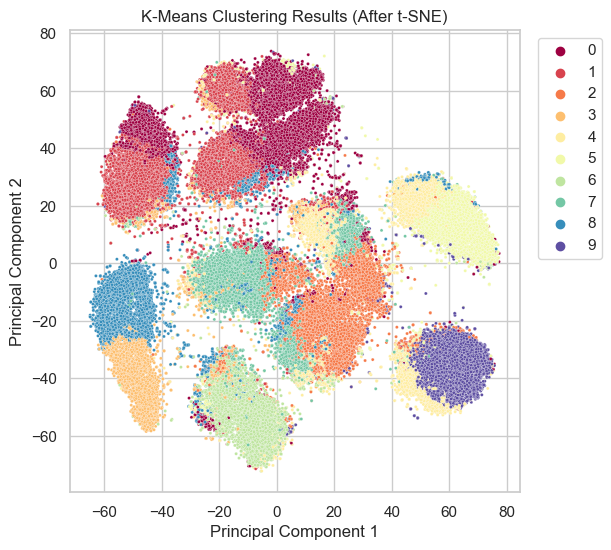

In [ ]:
print(f"Best Parameters: {best_kmeans_params}")
visualize_clusters(x_train_tsne, best_kmeans_labels, "K-Means Clustering Results (After t-SNE)", dim=2)

Best Parameters: {'init_params': 'random_from_data', 'tol': 0.1}


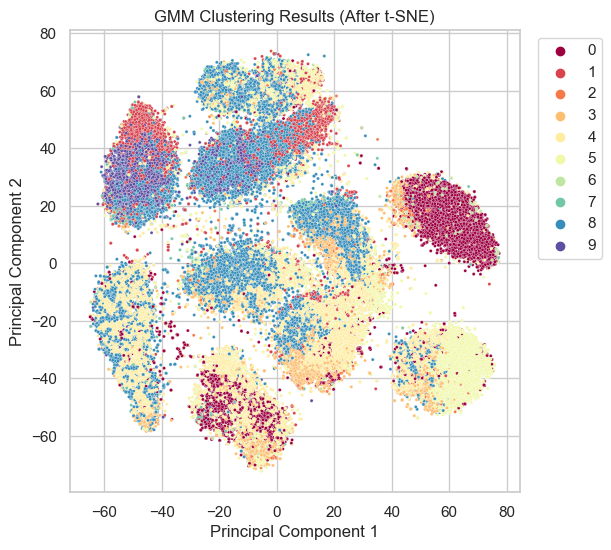

In [ ]:
print(f"Best Parameters: {best_gmm_params}")
visualize_clusters(x_train_tsne, best_gmm_labels, "GMM Clustering Results (After t-SNE)", dim=2)

Print best evaluation results for each clustering algorithm's best run


In [ ]:
print("Best K-Means Clustering Results:")
print(f"Homogeneity Score: {best_homogeneity_kmeans}")
print(f"Completeness Score: {best_completeness_kmeans}")
print(f"V-Measure Score: {best_v_measure_kmeans}")
print(f"Silhouette Score: {best_silhouette_kmeans}")

print("\nBest GMM Clustering Results:")
print(f"Homogeneity Score: {best_homogeneity_gmm}")
print(f"Completeness Score: {best_completeness_gmm}")
print(f"V-Measure Score: {best_v_measure_gmm}")
print(f"Silhouette Score: {best_silhouette_gmm}")


Best K-Means Clustering Results:
Homogeneity Score: 0.4942960979306923
Completeness Score: 0.5015483740387849
V-Measure Score: 0.49789582849329367
Silhouette Score: 0.05934268085282286

Best GMM Clustering Results:
Homogeneity Score: 0.26330611695543654
Completeness Score: 0.320888166955427
V-Measure Score: 0.28925930822997603
Silhouette Score: -0.0016522036063128537


#### Best Clustering method

In [ ]:
kmeans = KMeans(n_clusters=10, algorithm='lloyd', init='k-means++', random_state=42)

## Part 3: Classification
(7) Classify the raw data:
* Train a classifier of your choice on the raw pixel level values.
* Explore different parameters for the classification model and evaluate the results of the
model.

(8) Classification after dimensionality reduction:
* Train a classifier of your choice on the data obtaining from the selected dimensionality reduction model from (4).
Note: Some dimensionality reduction algorithms do not support transformation of new unseen samples. You can suggest ways to overcome this as long as you avoid data leakage in the training of the classifier.
* Explore different parameters for the classification model and evaluate the performance of the classifiers.

(9) Classification based on clustering results:
* Build a simple classifier based on the best clustering results from (6). Specifically, assign
a label to each cluster (e.g., the most common digit in the cluster) and use this label to predict the digit of a test image based on its cluster assignment.
Note: This approach is used for pedagogical purposes and is not recommended in practice.
* Explore different parameters for the classification model and evaluate the performance of the classifiers.

### Classify the raw data:

#### Train a classifier of your choice on the raw pixel level values.

In [ ]:
# Standardize the data
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

##### SVM

In [ ]:
# Train a logistic regression classifier
classifier = SVC(kernel='linear',random_state=42)
classifier.fit(x_train_scaled, y_train)

# Make predictions on the test set
y_pred = classifier.predict(x_test_scaled)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy * 100 :.3f}%")
print("Classification Report:")
print(report)

Accuracy: 92.107%
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1343
           1       0.95      0.98      0.97      1600
           2       0.89      0.92      0.90      1380
           3       0.88      0.91      0.90      1433
           4       0.90      0.94      0.92      1295
           5       0.87      0.88      0.88      1273
           6       0.96      0.93      0.94      1396
           7       0.95      0.93      0.94      1503
           8       0.92      0.85      0.88      1357
           9       0.92      0.89      0.91      1420

    accuracy                           0.92     14000
   macro avg       0.92      0.92      0.92     14000
weighted avg       0.92      0.92      0.92     14000



##### Random Forest

With Data Standartization

In [ ]:
# Train a Random Forest classifier - with scale
classifier = RandomForestClassifier(random_state=42) # n_estimators is 100 by default
classifier.fit(x_train_scaled, y_train)

# Make predictions on the test set
y_pred = classifier.predict(x_test_scaled)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy * 100 :.3f}%")
print("Classification Report:")
print(report)

Accuracy: 96.721%
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1343
           1       0.98      0.98      0.98      1600
           2       0.95      0.97      0.96      1380
           3       0.96      0.95      0.96      1433
           4       0.96      0.97      0.96      1295
           5       0.97      0.96      0.97      1273
           6       0.98      0.98      0.98      1396
           7       0.97      0.97      0.97      1503
           8       0.96      0.96      0.96      1357
           9       0.96      0.95      0.95      1420

    accuracy                           0.97     14000
   macro avg       0.97      0.97      0.97     14000
weighted avg       0.97      0.97      0.97     14000



Without Data Standartization

In [ ]:
# Train a Random Forest classifier - no scale
classifier = RandomForestClassifier(random_state=42) # n_estimators is 100 by default
classifier.fit(x_train, y_train)

# Make predictions on the test set
y_pred = classifier.predict(x_test)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy  * 100 :.3f}%")
print("Classification Report:")
print(report)

Accuracy: 96.700%
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1343
           1       0.98      0.98      0.98      1600
           2       0.95      0.97      0.96      1380
           3       0.96      0.95      0.95      1433
           4       0.96      0.97      0.96      1295
           5       0.97      0.96      0.97      1273
           6       0.98      0.98      0.98      1396
           7       0.97      0.97      0.97      1503
           8       0.96      0.95      0.96      1357
           9       0.96      0.95      0.95      1420

    accuracy                           0.97     14000
   macro avg       0.97      0.97      0.97     14000
weighted avg       0.97      0.97      0.97     14000



##### KNN

In [ ]:
# Train KNN Classifier
classifier = KNeighborsClassifier() # n_neighbors=5 as default
classifier.fit(x_train, y_train)

# Make predictions on the test set
y_pred = classifier.predict(x_test)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy * 100 :.3f}%")
print("Classification Report:")
print(report)

Accuracy: 97.007%
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1343
           1       0.96      0.99      0.98      1600
           2       0.98      0.96      0.97      1380
           3       0.97      0.97      0.97      1433
           4       0.97      0.97      0.97      1295
           5       0.97      0.97      0.97      1273
           6       0.98      0.99      0.98      1396
           7       0.96      0.97      0.97      1503
           8       0.99      0.93      0.96      1357
           9       0.95      0.96      0.96      1420

    accuracy                           0.97     14000
   macro avg       0.97      0.97      0.97     14000
weighted avg       0.97      0.97      0.97     14000



#### Explore different parameters for the classification model and evaluate the results of the model.

In [ ]:
# Best Classifier = KNN
param_grid = {
    'n_neighbors': [3, 5, 100, 200],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'kd_tree'],
}

best_accuracy = 0
best_params = None

# Perform manual GridSearchCV
for n_neighbors in param_grid['n_neighbors']:
    for weights in param_grid['weights']:
        for algorithm in param_grid['algorithm']:
            # Create a KNeighborsClassifier with the current parameter combination
            knn_classifier = KNeighborsClassifier(
                n_neighbors=n_neighbors,
                weights=weights,
                algorithm=algorithm
            )

            # Train the classifier on the training set
            knn_classifier.fit(x_train, y_train)

            # Make predictions on the test set
            y_pred = knn_classifier.predict(x_test)

            # Calculate accuracy on the test set
            test_accuracy = accuracy_score(y_test, y_pred)

            # Print current parameters and accuracy
            print(f"Parameters: n_neighbors={n_neighbors}, weights={weights}, algorithm={algorithm}")
            print(f"Test Set Accuracy: {test_accuracy*100:.3f}%\n")

            # Update best parameters if the current combination has a higher accuracy
            if test_accuracy > best_accuracy:
                best_accuracy = test_accuracy
                best_params = {
                    'n_neighbors': n_neighbors,
                    'weights': weights,
                    'algorithm': algorithm
                }

# Print the best parameters and test set accuracy
print(f"Best Parameters: {best_params}")
print(f"Best Test Set Accuracy: {best_accuracy * 100:.3f}%")


Parameters: n_neighbors=3, weights=uniform, algorithm=auto
Test Set Accuracy: 97.129%

Parameters: n_neighbors=3, weights=uniform, algorithm=kd_tree
Test Set Accuracy: 97.129%

Parameters: n_neighbors=3, weights=distance, algorithm=auto
Test Set Accuracy: 97.286%

Parameters: n_neighbors=3, weights=distance, algorithm=kd_tree
Test Set Accuracy: 97.286%

Parameters: n_neighbors=5, weights=uniform, algorithm=auto
Test Set Accuracy: 97.007%

Parameters: n_neighbors=5, weights=uniform, algorithm=kd_tree
Test Set Accuracy: 97.007%

Parameters: n_neighbors=5, weights=distance, algorithm=auto
Test Set Accuracy: 97.200%

Parameters: n_neighbors=5, weights=distance, algorithm=kd_tree
Test Set Accuracy: 97.200%

Parameters: n_neighbors=100, weights=uniform, algorithm=auto
Test Set Accuracy: 93.843%

Parameters: n_neighbors=100, weights=uniform, algorithm=kd_tree
Test Set Accuracy: 93.843%

Parameters: n_neighbors=100, weights=distance, algorithm=auto
Test Set Accuracy: 93.986%

Parameters: n_nei

In [ ]:
# Train a KNN classifier with the best parameters
best_knn_classifier = KNeighborsClassifier(**best_params)
best_knn_classifier.fit(x_train, y_train)

# Make predictions on the test set
y_pred = best_knn_classifier.predict(x_test)

# Evaluate the classifier on the test set
test_accuracy = accuracy_score(y_test, y_pred)
test_report = classification_report(y_test, y_pred)

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_accuracy*100:.3f}%")
print(f"Test Set Accuracy: {test_accuracy*100:.3f}%")
print("Test Set Classification Report:")
print(test_report)

Best Parameters: {'n_neighbors': 3, 'weights': 'distance', 'algorithm': 'auto'}
Best Cross-Validation Accuracy: 97.286%
Test Set Accuracy: 97.286%
Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1343
           1       0.96      0.99      0.98      1600
           2       0.98      0.96      0.97      1380
           3       0.97      0.96      0.97      1433
           4       0.97      0.97      0.97      1295
           5       0.97      0.97      0.97      1273
           6       0.98      0.99      0.99      1396
           7       0.97      0.98      0.97      1503
           8       0.99      0.94      0.96      1357
           9       0.96      0.96      0.96      1420

    accuracy                           0.97     14000
   macro avg       0.97      0.97      0.97     14000
weighted avg       0.97      0.97      0.97     14000



In [ ]:
def plot_confusion_matrix(y_t, y_p):
    # Create the confusion matrix
    cm = confusion_matrix(y_t, y_p)

    # Set the labels for both axes
    labels = [str(i) for i in range(10)]

    sns.heatmap(cm, annot=True, fmt="d", cmap=sns.cubehelix_palette(as_cmap=True), cbar=True,
                xticklabels=labels, yticklabels=labels,
                cbar_kws={'label': 'Count'})

    plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
    plt.yticks(rotation=0)   # Rotate y-axis labels if needed

    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()



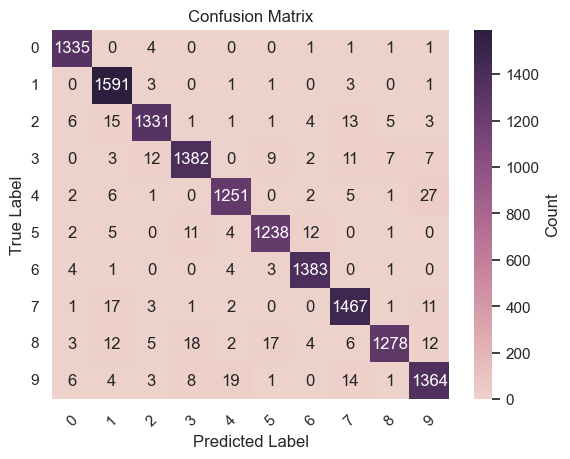

In [ ]:
plot_confusion_matrix(y_test, y_pred)

### Classification after dimensionality reduction:

#### Train a classifier of your choice on the data obtaining from the selected dimensionality reduction model from (4).
Note: Some dimensionality reduction algorithms do not support transformation of new unseen samples. You can suggest ways to overcome this as long as you avoid data leakage in the training of the classifier.


##### PCA

Random Forest Classifier

In [ ]:
# Train a Random Forest classifier on the predicted PCA embeddings
rf_classifier = RandomForestClassifier(n_estimators=200, random_state=42)
rf_classifier.fit(x_train_pca, y_train)

# Predict classes for the test data based on the Random Forest classifier
y_pred = rf_classifier.predict(x_test_pca)

# Evaluate the classification accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy on the test set: {accuracy * 100 :.3f}%")

Accuracy on the test set: 94.957%


KNN

In [ ]:
# Assign classes using kNN on the predicted PCA embeddings
knn_classifier = KNeighborsClassifier(n_neighbors=3)
knn_classifier.fit(x_train_pca, y_train)

# Predict classes for the test data based on the kNN classifier
y_pred_knn = knn_classifier.predict(x_test_pca)

# Evaluate the classification accuracy
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print(f"Accuracy on the test set: {accuracy_knn * 100 :.3f}%")

Accuracy on the test set: 93.200%


##### t-SNE

In [ ]:
# Train a neural network (non-linear method) for predicting t-SNE embedding
regressor = MLPRegressor(hidden_layer_sizes=(50, 50), random_state=42, max_iter=300)
regressor.fit(x_train, x_train_tsne)

# Use the trained model to predict t-SNE embedding for test data
x_test_tsne = regressor.predict(x_test)

Random Forest Classifier

In [ ]:
# Train a Random Forest classifier on the predicted t-SNE embeddings
rf_classifier = RandomForestClassifier(n_estimators=200, random_state=42)
rf_classifier.fit(x_train_tsne, y_train)

# Predict classes for the test data based on the Random Forest classifier
y_pred = rf_classifier.predict(x_test_tsne)

# Evaluate the classification accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy on the test set: {accuracy*100:.3f}%")

Accuracy on the test set: 81.786%


KNN

In [ ]:
# Assign classes using kNN on the predicted t-SNE embeddings
knn_classifier = KNeighborsClassifier(n_neighbors=5)
knn_classifier.fit(x_train_tsne, y_train)

# Predict classes for the test data based on the kNN classifier
y_pred_knn = knn_classifier.predict(x_test_tsne)

# Evaluate the classification accuracy
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print(f"Accuracy on the test set: {accuracy_knn*100:.3f}%")

Accuracy on the test set: 83.221%


#### Explore different parameters for the classification model and evaluate the performance of the classifiers.

In [ ]:
# Best Classifier with DR = Random Forest + PCA
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False],
}

best_accuracy = 0
best_params = None

for n_estimators in param_grid['n_estimators']:
    for max_depth in param_grid['max_depth']:
        for min_samples_split in param_grid['min_samples_split']:
            for min_samples_leaf in param_grid['min_samples_leaf']:
                for bootstrap in param_grid['bootstrap']:

                    # Create a RandomForestClassifier with the current parameter combination
                    rf_classifier = RandomForestClassifier(
                        n_estimators=n_estimators,
                        max_depth=max_depth,
                        min_samples_split=min_samples_split,
                        min_samples_leaf=min_samples_leaf,
                        bootstrap=bootstrap,
                        random_state=42
                    )

                    # Train the classifier on the training set
                    rf_classifier.fit(x_train_pca, y_train)

                    # Make predictions on the test set
                    y_pred = rf_classifier.predict(x_test_pca)

                    # Calculate accuracy on the test set
                    test_accuracy = accuracy_score(y_test, y_pred)

                    # Print current parameters and accuracy
                    print(f"Parameters: n_estimators={n_estimators}, max_depth={max_depth}, "
                          f"min_samples_split={min_samples_split}, min_samples_leaf={min_samples_leaf}, "
                          f"bootstrap={bootstrap}")
                    print(f"Test Set Accuracy: {test_accuracy * 100:.3f}%\n")

                    # Update best parameters if the current combination has a higher accuracy
                    if test_accuracy > best_accuracy:
                        best_accuracy = test_accuracy
                        best_params = {
                            'n_estimators': n_estimators,
                            'max_depth': max_depth,
                            'min_samples_split': min_samples_split,
                            'min_samples_leaf': min_samples_leaf,
                            'bootstrap': bootstrap
                        }

# Print the best parameters and test set accuracy
print(f"Best Parameters: {best_params}")
print(f"Best Test Set Accuracy: {best_accuracy * 100:.3f}%")

Parameters: n_estimators=50, max_depth=None, min_samples_split=2, min_samples_leaf=1, bootstrap=True
Test Set Accuracy: 93.950%

Parameters: n_estimators=50, max_depth=None, min_samples_split=2, min_samples_leaf=1, bootstrap=False
Test Set Accuracy: 94.350%

Parameters: n_estimators=50, max_depth=None, min_samples_split=2, min_samples_leaf=2, bootstrap=True
Test Set Accuracy: 94.150%

Parameters: n_estimators=50, max_depth=None, min_samples_split=2, min_samples_leaf=2, bootstrap=False
Test Set Accuracy: 94.657%

Parameters: n_estimators=50, max_depth=None, min_samples_split=5, min_samples_leaf=1, bootstrap=True
Test Set Accuracy: 94.029%

Parameters: n_estimators=50, max_depth=None, min_samples_split=5, min_samples_leaf=1, bootstrap=False
Test Set Accuracy: 94.793%

Parameters: n_estimators=50, max_depth=None, min_samples_split=5, min_samples_leaf=2, bootstrap=True
Test Set Accuracy: 94.086%

Parameters: n_estimators=50, max_depth=None, min_samples_split=5, min_samples_leaf=2, bootstra

In [ ]:
# Train a RF classifier with the best parameters
best_rf_classifier = RandomForestClassifier(random_state=42, **best_params)
best_rf_classifier.fit(x_train_pca, y_train)

# Make predictions on the test set
y_pred = best_rf_classifier.predict(x_test_pca)

# Evaluate the classifier on the test set
test_accuracy = accuracy_score(y_test, y_pred)
test_report = classification_report(y_test, y_pred)

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_accuracy*100:.3f}%")
print(f"Test Set Accuracy: {test_accuracy*100:.3f}%")
print("Test Set Classification Report:")
print(test_report)

Best Parameters: {'n_estimators': 200, 'max_depth': None, 'min_samples_split': 5, 'min_samples_leaf': 2, 'bootstrap': False}
Best Cross-Validation Accuracy: 95.429%
Test Set Accuracy: 95.429%
Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1343
           1       0.98      0.98      0.98      1600
           2       0.95      0.96      0.96      1380
           3       0.93      0.94      0.93      1433
           4       0.94      0.96      0.95      1295
           5       0.94      0.94      0.94      1273
           6       0.97      0.98      0.97      1396
           7       0.96      0.96      0.96      1503
           8       0.94      0.91      0.93      1357
           9       0.94      0.93      0.94      1420

    accuracy                           0.95     14000
   macro avg       0.95      0.95      0.95     14000
weighted avg       0.95      0.95      0.95     14000



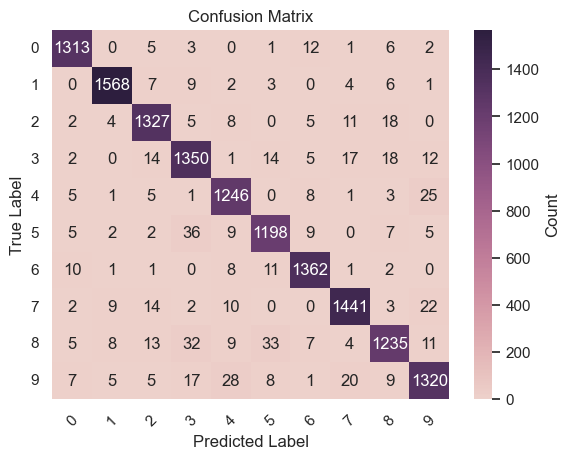

In [ ]:
plot_confusion_matrix(y_test, y_pred)

### Classification based on clustering results:

#### Build a simple classifier based on the best clustering results from (6). Specifically, assign a label to each cluster (e.g., the most common digit in the cluster) and use this label to predict the digit of a test image based on its cluster assignment.
Note: This approach is used for pedagogical purposes and is not recommended in practice.

In [ ]:
def evaluate_cluster_based_classifier(y_train, x_test, y_test, cluster_assignments):
    # Assign a label to each cluster based on the most common digit in the cluster
    cluster_labels = {}
    for cluster in np.unique(cluster_assignments):
        # Find the indices of data points assigned to the current cluster
        cluster_indices = np.where(cluster_assignments == cluster)[0]

        # Extract the actual labels (digits) corresponding to the cluster indices
        cluster_digits = y_train.iloc[cluster_indices]

        # Count the occurrences of each digit and find the most common one
        most_common_digit = Counter(cluster_digits).most_common(1)[0][0]

        # Assign the most common digit as the label for the current cluster
        cluster_labels[cluster] = most_common_digit

    # Predict the digit for test images based on their cluster assignment
    test_cluster_assignments = kmeans.predict(x_test)
    predicted_digits = [cluster_labels[cluster] for cluster in test_cluster_assignments]

    # Evaluate the classifier
    accuracy = accuracy_score(y_test, predicted_digits)

    return accuracy, predicted_digits

def visualize_cluster_assignments(y_train, x_test, y_test, kmeans, num_samples=10):
    # Record cluster assignments for test data
    _, cluster_assignments_test = evaluate_cluster_based_classifier(y_train, x_test, y_test, kmeans.labels_)

    # Create figure with subplots using matplotlib.pyplot
    fig, axs = plt.subplots(2, 5, figsize=(10, 5))
    plt.gray()

    # Loop through subplots and add images from x_test
    for i, ax in enumerate(axs.flat):
        if i >= num_samples:
            break  # Stop if we've displayed the desired number of samples

        sample_index = i
        inferred_label = cluster_assignments_test[sample_index]

        ax.set_title('Inferred Label: {}'.format(inferred_label))

        # If x_test is a Pandas DataFrame, convert it to a NumPy array
        sample_image = x_test.values[sample_index] if isinstance(x_test, pd.DataFrame) else x_test[sample_index]

        ax.matshow(sample_image.reshape(28, 28), cmap='gray')
        ax.axis('off')

    # Display the figure
    plt.show()


Without Dimentionality Reduction

In [ ]:
cluster_assignments = kmeans.fit_predict(x_train)

accuracy_result_no_dr, _ = evaluate_cluster_based_classifier(y_train, x_test, y_test, cluster_assignments)
print(f"Accuracy on the test set: {accuracy_result_no_dr*100:.3f}%")

Accuracy on the test set: 58.379%


With Dimentionality Reduction (t-SNE)

In [ ]:
kmeans = KMeans(n_clusters=10, algorithm='lloyd', init='k-means++', random_state=42)

In [ ]:
transformed_train = x_train_tsne.astype('double')
transformed_test = x_test_tsne.astype('double')

In [ ]:
cluster_assignments = kmeans.fit_predict(transformed_train)

accuracy_result_dr, _ = evaluate_cluster_based_classifier(y_train, transformed_test, y_test, cluster_assignments)
print(f"Accuracy on the test set: {accuracy_result_dr*100:.3f}%")

Accuracy on the test set: 84.371%


#### Explore different parameters for the classification model and evaluate the performance of the classifiers.

In [ ]:
# Number of clusters to experiment with
cluster_numbers = [5, 10, 40, 80, 100]
n_inits = [10, 'auto']

In [ ]:
# Evaluate classifier on new unseen data
for n_clusters in cluster_numbers:
    for n_init in n_inits:
        kmeans = KMeans(n_clusters=n_clusters, algorithm='lloyd', init='k-means++', random_state=42, n_init = n_init)
        cluster_assignments = kmeans.fit_predict(x_train)
        accuracy_result_no_dr, _ = evaluate_cluster_based_classifier(y_train, x_test, y_test, cluster_assignments)
        print(f"Accuracy on the test set with {n_clusters} clusters and n_init = {n_init}: {accuracy_result_no_dr*100:.3f}%")


Accuracy on the test set with 5 clusters and n_init = 10: 45.571%
Accuracy on the test set with 5 clusters and n_init = auto: 45.571%
Accuracy on the test set with 10 clusters and n_init = 10: 58.379%
Accuracy on the test set with 10 clusters and n_init = auto: 59.036%
Accuracy on the test set with 40 clusters and n_init = 10: 78.400%
Accuracy on the test set with 40 clusters and n_init = auto: 80.414%
Accuracy on the test set with 80 clusters and n_init = 10: 85.693%
Accuracy on the test set with 80 clusters and n_init = auto: 85.750%
Accuracy on the test set with 100 clusters and n_init = 10: 87.550%
Accuracy on the test set with 100 clusters and n_init = auto: 86.829%



 Visualize cluster assignments for 10 samples, kmeans with 5 clusters


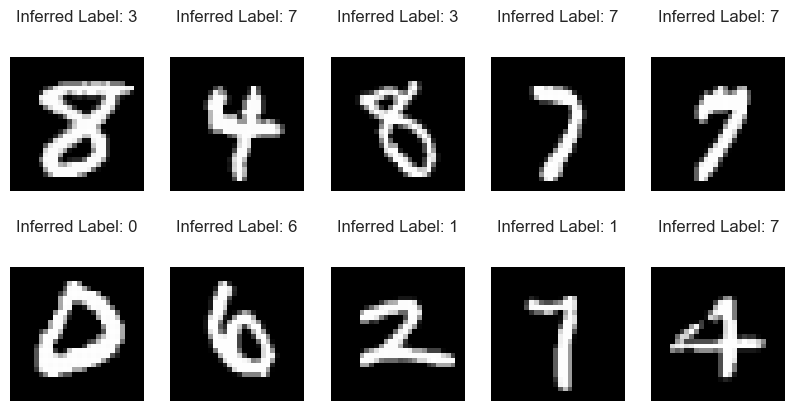


 Visualize cluster assignments for 10 samples, kmeans with 10 clusters


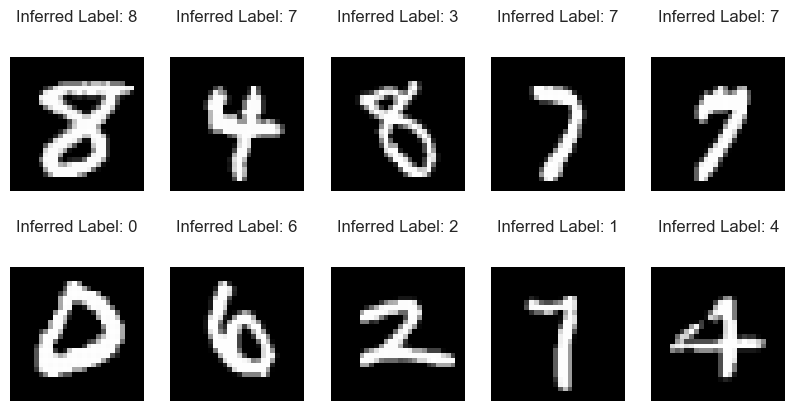


 Visualize cluster assignments for 10 samples, kmeans with 40 clusters


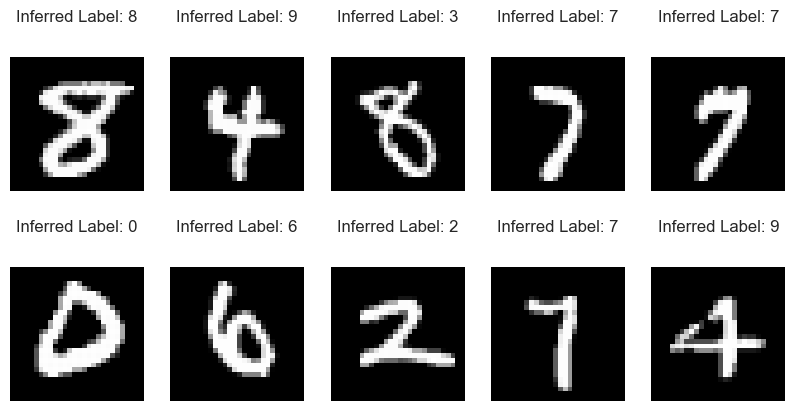


 Visualize cluster assignments for 10 samples, kmeans with 80 clusters


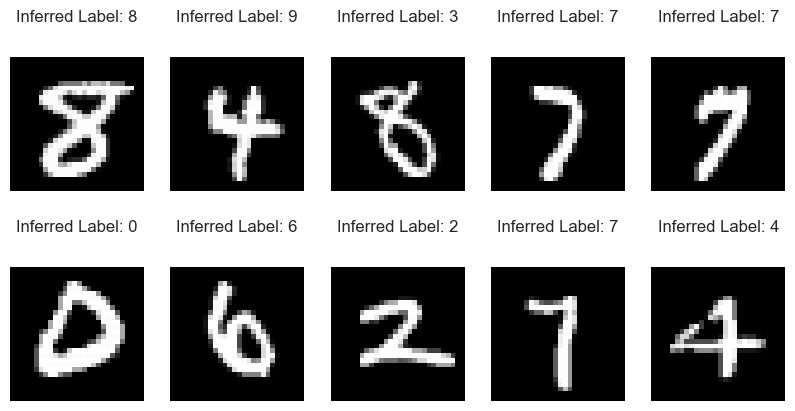


 Visualize cluster assignments for 10 samples, kmeans with 100 clusters


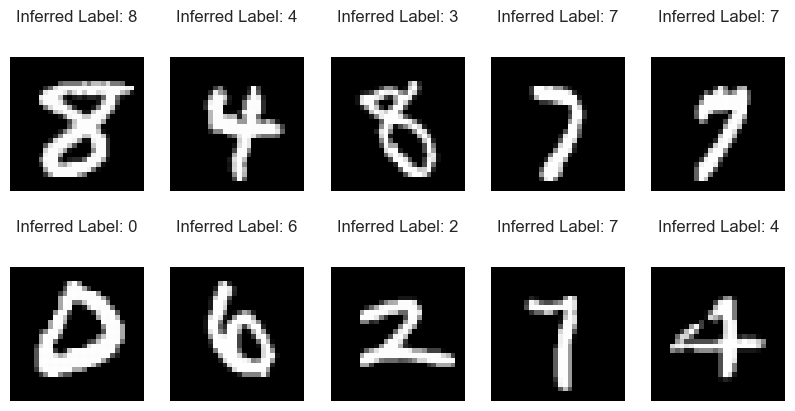

In [ ]:
# Print labels examples as a result of different number of clusters
for n_clusters in cluster_numbers:
  print(f"\n Visualize cluster assignments for 10 samples, kmeans with {n_clusters} clusters")
  kmeans = KMeans(n_clusters=n_clusters, algorithm='lloyd', init='k-means++', random_state=42, n_init = 10)
  kmeans.fit(x_train)
  visualize_cluster_assignments(y_train, x_test, y_test, kmeans, num_samples=10)
